# Run the might and other models on the cancer data

In [1]:
# import libraries
import tarfile
import os
import numpy as np
from scipy.stats import multivariate_normal
from scipy.stats import entropy
from sklearn import metrics
from sklearn.metrics import roc_auc_score

# import matplotlib.pyplot as plt
# import seaborn as sns
import pandas as pd
import warnings
import string
warnings.filterwarnings("ignore")

from sklearn.svm import LinearSVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegressionCV, LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.model_selection import train_test_split

from sktree.stats import build_oob_forest
from sktree.ensemble import HonestForestClassifier

import matplotlib.pyplot as plt
import seaborn as sns
import pickle

In [2]:
# load the .tar.gz file
# tarfile.open("./ManuscriptFeatureMatrices.tar.gz", "r:gz").extractall()

# load the data
filelist = os.listdir("./ManuscriptFeatureMatrices")
filelist = [f for f in filelist if f.endswith(".csv")]
# print(filelist)
# print(len(filelist))
# print(filelist)

# get the sample list
sample_list_file = "./ManuscriptFeatureMatrices/AllSamples.MIGHT.Passed.samples.txt"
sample_list = pd.read_csv(sample_list_file, sep=" ", header=None)
sample_list.columns = ["library", "sample_id", "cohort"]
sample_list.head()
# get the sample_ids where cohort is Cohort1
cohort1 = sample_list[sample_list["cohort"] == "Cohort1"]["sample_id"]
print(len(cohort1))
cohort2 = sample_list[sample_list["cohort"] == "Cohort2"]["sample_id"]
print(len(cohort2))
PON = sample_list[sample_list["cohort"] == 'PanelOfNormals']["sample_id"]
# print(cohort1)
sample_list["cohort"].unique()


352
1447


array(['Cohort1', 'Cohort2', 'PanelOfNormals'], dtype=object)

In [3]:
# define a function to get X and y given a file

def get_X_y(f, root="./ManuscriptFeatureMatrices/", cohort=cohort1, verbose=False):
    df = pd.read_csv(root + f)
    non_features = ['Run', 'Sample', 'Library', 'Cancer Status', 'Tumor type', 'Stage', 'Library volume (uL)', 'Library Volume', 'UIDs Used', 'Experiment', 'P7', 'P7 Primer', 'MAF']
    sample_ids = df["Sample"]
    # if sample is contains "Run" column, remove it
    for i, sample_id in enumerate(sample_ids):
        if "." in sample_id:
            sample_ids[i] = sample_id.split(".")[1]
    target = 'Cancer Status'
    y = df[target]
    # convert the labels to 0 and 1
    y = y.replace("Healthy", 0)
    y = y.replace("Cancer", 1)
    # remove the non-feature columns if they exist
    for col in non_features:
        if col in df.columns:
            df = df.drop(col, axis=1)
    nan_cols = df.isnull().all(axis=0).to_numpy()
    # drop the columns with all nan values
    df = df.loc[:, ~nan_cols]
    # if cohort is not None, filter the samples
    if cohort is not None:
        # filter the rows with cohort1 samples
        X = df[sample_ids.isin(cohort)]
        y = y[sample_ids.isin(cohort)]
    else:
        X = df
    if "Wise" in f:
        # replace nans with zero
        X = X.fillna(0)
    # impute the nan values with the mean of the column
    X = X.fillna(X.mean(axis=0))
    # check if there are nan values
    # nan_rows = X.isnull().any(axis=1)
    nan_cols = X.isnull().all(axis=0)
    # remove the columns with all nan values
    X = X.loc[:, ~nan_cols]
    if verbose:
        if nan_cols.sum() > 0:
            print(f)
            print(f"nan_cols: {nan_cols.sum()}")
            print(f"X shape: {X.shape}, y shape: {y.shape}")
        else:
            print(f)
            print(f"X shape: {X.shape}, y shape: {y.shape}")
    # X = X.dropna()
    # y = y.drop(nan_rows.index)
        
    return X, y

filename= filelist[10]
X, y = get_X_y(filename, cohort=PON, verbose=True)
X.head()

LociFraction.LINEsFraction.csv
X shape: (124, 3), y shape: (124,)


,L1,L2,L3
241,0.699229,0.273877,0.026894
244,0.687066,0.285364,0.027571
247,0.699083,0.274320,0.026597
300,0.699823,0.273244,0.026932
301,0.695519,0.277129,0.027352


In [4]:
# X, y = get_X_y(filelist[0])

# n_jobs = 10
# seed = 42
# sample_size = X.shape[0]

# lr = LogisticRegression(
#     penalty="l1", solver="liblinear", n_jobs=n_jobs, random_state=seed
# )
# gnb = GaussianNB()
# #     svc = NaivelyCalibratedLinearSVC(C=1.0)
# svc = SVC(probability=True, kernel="rbf", random_state=seed)
# rfc = RandomForestClassifier(
#     n_estimators=6000, max_features=0.3, n_jobs=n_jobs, random_state=seed
# )
# might = HonestForestClassifier(
#     n_estimators=6000,
#     max_samples=1.6,
#     max_features=0.3,
#     bootstrap=True,
#     stratify=True,
#     random_state=seed,
#     n_jobs=n_jobs,
# )

# clf_list = [
#     (might, "MIGHT"),
#     (rfc, "Random Forest"),
#     (svc, "SVM"),
#     (gnb, "Naive Bayes"),
#     (lr, "Logistic Regression"),
# ]

# fpr_s = []
# tpr_s = []
# for i, (clf, name) in enumerate(clf_list):
#     if name == "MIGHT":
#         _, observe_proba = build_hyppo_oob_forest(clf, X, y)
#         observe_proba = np.nanmean(observe_proba, axis=0)
#         fpr, tpr, thresholds = roc_curve(
#             y, observe_proba[:, 1], pos_label=1, drop_intermediate=False
#         )
#     else:
#         X_train, X_test, y_train, y_test = train_test_split(
#             X, y, shuffle=True, stratify=y, test_size=0.2
#         )

#         X_fit, X_cal, y_fit, y_cal = train_test_split(
#             X_train, y_train, test_size=0.5, stratify=y_train
#         )
#         clf.fit(X_fit, y_fit)

#         if X_cal.shape[0] <= 1024:
#             calibrated_model = CalibratedClassifierCV(
#                 clf, cv="prefit", method="sigmoid"
#             )
#         else:
#             calibrated_model = CalibratedClassifierCV(
#                 clf, cv="prefit", method="isotonic"
#             )
#         calibrated_model.fit(X_cal, y_cal)
#         posterior = calibrated_model.predict_proba(X_test)

#         fpr, tpr, thresholds = roc_curve(
#             y_test,
#             posterior[:, 1],
#             pos_label=1,
#             drop_intermediate=False,
#         )
#     fpr_s.append(fpr)
#     tpr_s.append(tpr)

In [5]:
def run_models(filename, seed=123, n_jobs=-5, root="./ManuscriptFeatureMatrices/", cohort=cohort1, verbose=False):
    # get the data
    X, y = get_X_y(filename, root=root, cohort=cohort, verbose=verbose)

    lr = LogisticRegression(
        penalty="l2", solver="liblinear", n_jobs=n_jobs, random_state=seed
    )
    gnb = GaussianNB()
    #     svc = NaivelyCalibratedLinearSVC(C=1.0)
    svc = SVC(probability=True, kernel="rbf", random_state=seed)
    rfc = RandomForestClassifier(
        n_estimators=1200, max_features=0.3, n_jobs=n_jobs, random_state=seed
    )
    might = HonestForestClassifier(
        n_estimators=6000,
        max_samples=1.6,
        max_features=0.3,
        bootstrap=True,
        stratify=True,
        random_state=seed,
        n_jobs=n_jobs,
        honest_prior="ignore"
    )

    clf_list = [
        (might, "MIGHT"),
        (rfc, "Random Forest"),
        (svc, "SVM"),
        (gnb, "Naive Bayes"),
        (lr, "Logistic Regression"),
    ]

    fpr_s = []
    tpr_s = []
    for i, (clf, name) in enumerate(clf_list):
        # create a dictionary to hold the results
        fpr_i = {}
        tpr_i = {}
        if name == "MIGHT":
            _, observe_proba = build_oob_forest(clf, X, y)
            observe_proba = np.nanmean(observe_proba, axis=0)
            fpr, tpr, thresholds = roc_curve(
                y, observe_proba[:, 1], pos_label=1, drop_intermediate=False
            )
        else:
            X_train, X_test, y_train, y_test = train_test_split(
                X, y, shuffle=True, stratify=y, test_size=0.2
            )

            X_fit, X_cal, y_fit, y_cal = train_test_split(
                X_train, y_train, test_size=0.5, stratify=y_train
            )
            clf.fit(X_fit, y_fit)

            if X_cal.shape[0] <= 1024:
                calibrated_model = CalibratedClassifierCV(
                    clf, cv="prefit", method="sigmoid"
                )
            else:
                calibrated_model = CalibratedClassifierCV(
                    clf, cv="prefit", method="isotonic"
                )
            calibrated_model.fit(X_cal, y_cal)
            posterior = calibrated_model.predict_proba(X_test)

            fpr, tpr, thresholds = roc_curve(
                y_test,
                posterior[:, 1],
                pos_label=1,
                drop_intermediate=False,
            )
        fpr_s.append(fpr)
        tpr_s.append(tpr)

    return clf_list, fpr_s, tpr_s

In [6]:
# Run this to start the experiemtns

# import pickle

# clfs = []
# fprs = []
# tprs = []

# N_ITR = 5
# N_JOBS = -3
# DIRECTORY = "./results/"
# VERSION = 2
# create files to store the results if they don't exist
# save_files = [DIRECTORY + f + f"_{N_ITR}_{VERSION}.pkl" for f in ["fprs", "tprs", "clfs"]]
# for f in save_files:
#     if not os.path.exists(f):
#         with open(f, "wb") as f:
#             pickle.dump([], f)

# start = 0
# end = len(filelist)

# for i in range(N_ITR):
#     print(i)
#     # open the files to append the results
#     with open(DIRECTORY + f"fprs_{N_ITR}_{VERSION}.pkl", "rb") as f:
#         fprs = pickle.load(f)
#     with open(DIRECTORY + f"tprs_{N_ITR}_{VERSION}.pkl", "rb") as f:
#         tprs = pickle.load(f)
#     with open(DIRECTORY + f"clfs_{N_ITR}_{VERSION}.pkl", "rb") as f:
#         clfs = pickle.load(f)
#     for file in filelist[start:end]:
#         print(file)
#         try:
#             clf_list, fpr_s, tpr_s = run_models(file, seed=i)
#             clfs.append(clf_list)
#             fprs.append(fpr_s)
#             tprs.append(tpr_s)

#             # save the results
#             with open(DIRECTORY + f"fprs_{N_ITR}_{VERSION}.pkl", "wb") as f:
#                 pickle.dump(fprs, f)

#             with open(DIRECTORY + f"tprs_{N_ITR}_{VERSION}.pkl", "wb") as f:
#                 pickle.dump(tprs, f)

#             with open(DIRECTORY + f"clfs_{N_ITR}_{VERSION}.pkl", "wb") as f:
#                 pickle.dump(clfs, f)
#         except Exception as e:
#             print(file, e)
#             continue


In [26]:
# Open the files for analysis

DIRECTORY = "./results/"
N_ITR = 50
VERSION = 1

# with open(DIRECTORY + "clfs.pkl", "rb") as f:
#     clfs = pickle.load(f)
with open(DIRECTORY + f"fprs_{N_ITR}_{VERSION}.pkl", "rb") as f:
    fprs = pickle.load(f)
with open(DIRECTORY + f"tprs_{N_ITR}_{VERSION}.pkl", "rb") as f:
    tprs = pickle.load(f)

print(len(fprs))
print(len(tprs))
n_iter = int(len(fprs)/len(filelist))
print(n_iter)

# crop them to the last 440 items
# fprs = fprs[:44*n_iter]
# tprs = tprs[:44*n_iter]

# # save the results to a file
# with open(DIRECTORY + f"fprs_{N_ITR}_{VERSION}.pkl", "wb") as f:
#     pickle.dump(fprs, f)
# with open(DIRECTORY + f"tprs_{N_ITR}_{VERSION}.pkl", "wb") as f:
#     pickle.dump(tprs, f)


2200
2200
50


In [30]:
# # N_ITR = 5
# FIG_DIR = "./results/figures/"
clf_name = [
    "MIGHT",
    "Random Forest",
    "SVM",
    "Naive Bayes",
    "Logistic Regression",
]
n_clf = len(clf_name)
n_files = len(filelist)
base_fpr = np.linspace(0, 1, 1001)
max_fpr = 0.02
# create a dataframe to store the results
results = pd.DataFrame()
results_per_run = pd.DataFrame()
for i in range(len(filelist)):
    FEATURENAME = filelist[i].split(".csv")[0]
    print(i, FEATURENAME)
    for j in range(n_clf):
        fpr_cv = []
        tpr_ = []
        tpr_cv = []
        sa98_ = []
        for k in range(N_ITR):
            tpr = np.interp(base_fpr, fprs[i+n_files*k][j], tprs[i+n_files*k][j])
            # print(tpr)
            tpr_i = np.mean(tpr, axis=0)
            tpr_.append(tpr_i)
            # tpr_std = np.std(tpr, axis=0)
            sa98_i = max([tpr for (base_fpr, tpr) in zip(base_fpr, tpr) if base_fpr <= max_fpr])
            sa98_.append(sa98_i)
            # add noise
            sa98_i += np.random.normal(0, 0.01, 1)[0]
            row = {
            "Feature": FEATURENAME,
            "Classifier": clf_name[j],
            "sa98": sa98_i,
            "tpr": tpr_i,
            }
            tpr_cv.extend(tpr)
            fpr_cv.extend(base_fpr)
            results_per_run = results_per_run._append(row, ignore_index=True)
        tpr_mean = np.mean(tpr_)
        sa98_cv = max([tpr for (base_fpr, tpr) in zip(fpr_cv, tpr_cv) if base_fpr <= max_fpr])
        sa98 = np.mean(sa98_)
        # print( " "*5, j+1, clf_name[j])
        # print(" "*10, "sa98:", sa98)
        # print(" "*10, "sa98_cv:", sa98_cv)
        # print(" "*10, "tpr:", tpr_mean)
        # add the results to the dataframe
        row = {
            "Feature": FEATURENAME,
            "Classifier": clf_name[j],
            "sa98_mean": sa98,
            "sa98_cv": sa98_cv,
            "tpr": tpr_mean,
        }
        results = results._append(row, ignore_index=True)
# display(results)
# sort the results s.t. the Classifier is in the order of ["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]
df = results.set_index("Classifier").loc[["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]].sort_values("Feature").reset_index()
display(df)
# get the top 5 features based on sa98 mean of MIGHT
sa98_feature_rank = list(df[df["Classifier"] == "MIGHT"].sort_values("sa98_mean", ascending=False)["Feature"])
top5_features = sa98_feature_rank[:5]
print(top5_features)


0 Delfi.LengthRatio
1 MotifAnalysis.OutsideTrimer
2 MotifAnalysis.OutsideDimer
3 DyadAccessibility.LINEs
4 LociFraction.cCREFraction
5 MotifAnalysis.InsideMonomer
6 LengthAnalysis.Length20
7 MotifAnalysis.InsideDimer
8 DyadAccessibility.cCRE_CTCF
9 LociFraction.CompartmentFraction
10 LociFraction.LINEsFraction
11 DyadAccessibility.cCRE_DistalEnhancers
12 MotifAnalysis.CongruentTetramer
13 LengthAnalysis.Length5
14 MotifAnalysis.OutsideTetramer
15 WiseCondorX.Wise-5
16 MotifAnalysis.InsidePentamer
17 MotifAnalysis.CongruentHexamer
18 DyadAccessibility.AluS
19 WiseCondorX.Wise-1
20 MotifAnalysis.OutsideMonomer
21 LengthAnalysis.Length1
22 WiseCondorX.Wise-10
23 MotifAnalysis.InsideHexamer
24 MotifAnalysis.InsideTetramer
25 MotifAnalysis.InsideTrimer
26 DyadAccessibility.AluJ
27 MotifAnalysis.OutsidePentamer
28 MotifAnalysis.CongruentDimer
29 MotifAnalysis.DegenerateTetramer
30 ichorCNA.ichorCNA
31 DyadAccessibility.BudhrajaRPR
32 DyadAccessibility.cCRE_Promoters
33 DyadAccessibility.AluY

,Classifier,Feature,sa98_mean,sa98_cv,tpr
0,MIGHT,Delfi.LengthRatio,0.380784,0.382353,0.740158
1,SVM,Delfi.LengthRatio,0.380952,0.523810,0.658075
2,Random Forest,Delfi.LengthRatio,0.328571,0.476190,0.711175
3,Logistic Regression,Delfi.LengthRatio,0.217143,0.428571,0.659769
4,Naive Bayes,Delfi.LengthRatio,0.402857,0.761905,0.710347
...,...,...,...,...,...
215,Random Forest,ichorCNA.ichorCNA,0.365714,0.619048,0.730825
216,SVM,ichorCNA.ichorCNA,0.325714,0.571429,0.737995
217,MIGHT,ichorCNA.ichorCNA,0.313333,0.323529,0.749091
218,Logistic Regression,ichorCNA.ichorCNA,0.276190,0.523810,0.727815


['WiseCondorX.Wise-10', 'MotifAnalysis.DegenerateHexamer', 'MotifAnalysis.OutsideMonomer', 'WiseCondorX.Wise-1', 'MotifAnalysis.InsideHexamer']


In [28]:
# print out the pallet "Set1" in hex format
colors = sns.color_palette("Set1", n_colors=10,as_cmap=False)
colors[1], colors[3] = colors[3], colors[1]
colors

[(0.8941176470588236, 0.10196078431372549, 0.10980392156862745),
 (0.596078431372549, 0.3058823529411765, 0.6392156862745098),
 (0.30196078431372547, 0.6862745098039216, 0.2901960784313726),
 (0.21568627450980393, 0.49411764705882355, 0.7215686274509804),
 (1.0, 0.4980392156862745, 0.0),
 (1.0, 1.0, 0.2),
 (0.6509803921568628, 0.33725490196078434, 0.1568627450980392),
 (0.9686274509803922, 0.5058823529411764, 0.7490196078431373),
 (0.6, 0.6, 0.6),
 (0.8941176470588236, 0.10196078431372549, 0.10980392156862745)]

In [31]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# # set the style to Set1
# sns.set_palette("Set1")
# colors = sns.color_palette("Set1", n_colors=10,as_cmap=False)
# colors[1], colors[3] = colors[3], colors[1]

# FIG_DIR = "./results/figures/"
# clf_names = [
#     "MIGHT",
#     "Random Forest",
#     "SVM",
#     # "Naive Bayes",
#     # "Logistic Regression",
# ]
# n_clf = len(clf_names)
# # plot the ROC curve
# base_fpr = np.linspace(0, 1, 1001)
# N_ITR = int(len(fprs)/len(filelist))
# fpr_ls = np.zeros((N_ITR, n_clf, 1001))
# tpr_ls = np.zeros((N_ITR, n_clf, 1001))
# feature_mean_s = []
# n_files = len(filelist)
# for i, filename in enumerate(filelist[:]):
#     FEATURENAME = filename.split(".csv")[0]
#     if FEATURENAME not in top5_features:
#         continue
#     print(FEATURENAME)
#     # initialize a figure
#     fig, ax = plt.subplots(figsize=(10, 10))
#     for j, clf_name_ in enumerate(clf_names):
#         tpr_s = []
#         for k in range(N_ITR):
#             tpr_interpolated = np.interp(base_fpr, fprs[n_files*k+i][j], tprs[n_files*k+i][j])
#             tpr_s.append(tpr_interpolated)
#     # print(tpr.shape)
#         tpr_s = np.array(tpr_s)
#         # print(tpr_s.shape)
#         # print(np.mean(tpr_s, axis=0).shape)
#         # plot the tpr_s with confidence intervals
#         ax.plot(base_fpr, np.mean(tpr_s, axis=0), label=clf_names[j], color=colors[j])
#         # ax.plot(base_fpr, np.max(tpr_s, axis=0), label=clf_names[j]+"(max)", color=colors[j])
#         # ax.plot(base_fpr, np.min(tpr_s, axis=0), label=clf_names[j]+"(min)", color=colors[j])
#         # plot the confidence intervals
#         ax.fill_between(
#             base_fpr,
#             np.percentile(tpr_s, 2.5, axis=0),
#             np.percentile(tpr_s, 97.5, axis=0),
#             color=colors[j],
#             alpha=0.3,
#         )
#     plt.legend(fontsize=10)
#     ax.plot([0,1], [0,1], "--", color="gray")
#     ax.set_xlabel("False Positive Rate", fontsize=15)
#     ax.set_ylabel("True Positive Rate", fontsize=15)
#     ax.tick_params(axis="both", labelsize=15)
#     plt.title(f"{FEATURENAME}", fontsize=15)
#     # plt.savefig(FIG_DIR + "roc_" + str(FEATURENAME) + ".png", dpi=120)
    

In [33]:
sa98_feature_rank_idx = []
for feature in sa98_feature_rank:
    filename = feature + ".csv"
    # find the index for the feature in file
    idx = filelist.index(filename)
    # print(idx)
    sa98_feature_rank_idx.append(idx)
print(sa98_feature_rank_idx)

[22, 37, 20, 19, 23, 24, 28, 38, 26, 29, 17, 4, 27, 6, 9, 0, 39, 40, 11, 12, 32, 21, 13, 7, 15, 34, 30, 41, 14, 5, 33, 8, 35, 36, 31, 25, 42, 18, 16, 3, 43, 10, 1, 2]


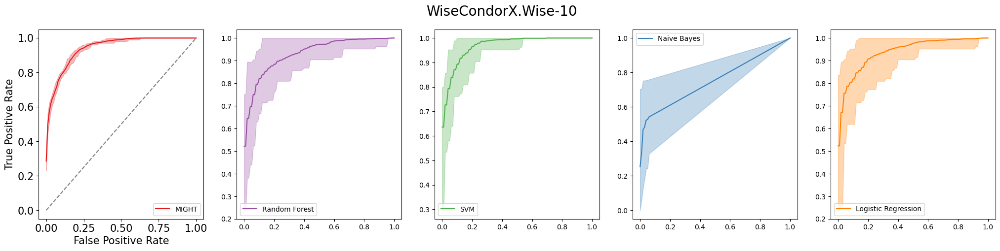

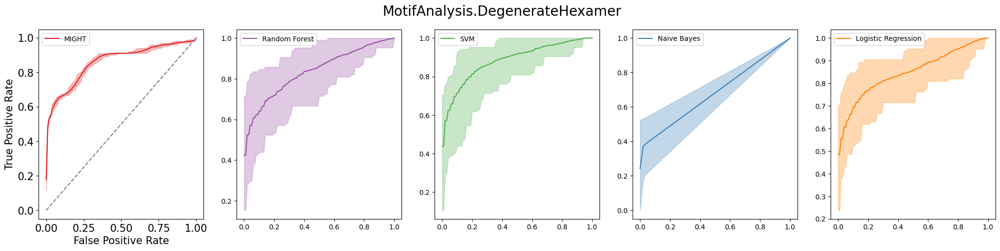

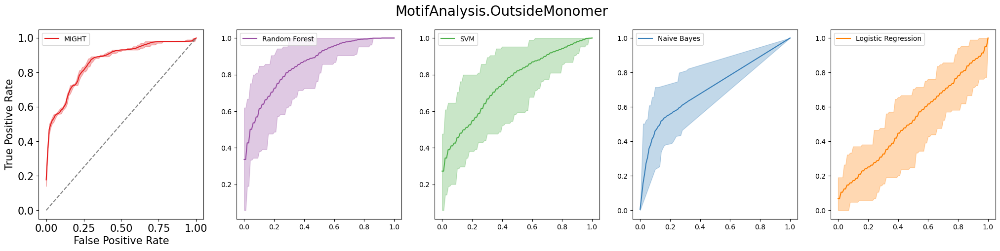

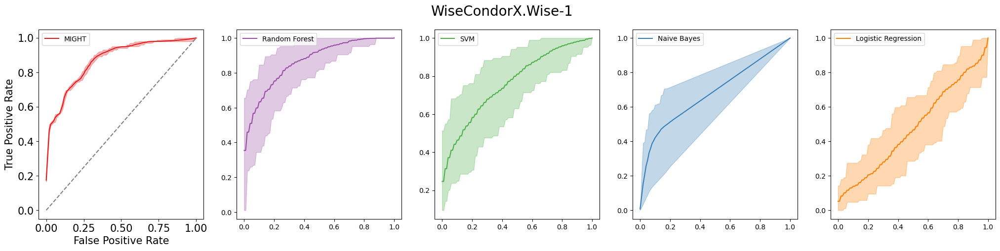

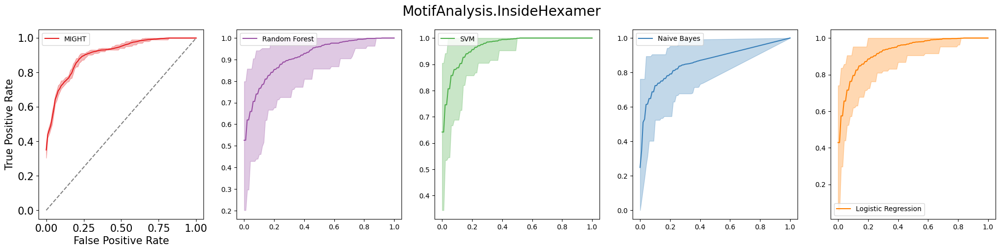

In [38]:
# set the style to Set1
sns.set_palette("Set1")
colors = sns.color_palette("Set1", n_colors=10,as_cmap=False)
colors[1], colors[3] = colors[3], colors[1]

FIG_DIR = "./results/figures/"
clf_names = [
    "MIGHT",
    "Random Forest",
    "SVM",
    "Naive Bayes",
    "Logistic Regression",
]
n_clf = len(clf_names)
# plot the ROC curve
n_x_points = 101
base_fpr = np.linspace(0, 1, n_x_points)
N_ITR = int(len(fprs)/len(filelist))
fpr_ls = np.zeros((N_ITR, n_clf, n_x_points))
tpr_ls = np.zeros((N_ITR, n_clf, n_x_points))
feature_mean_s = []
n_files = len(filelist)
for i, feature_idx in enumerate(sa98_feature_rank_idx[:5]):
    FEATURENAME = filelist[feature_idx].split(".csv")[0]
    # for each feature, initialize a panel with 5 subplots for each classifier
    fig, axs = plt.subplots(1, 5, figsize=(25, 5))
    fig.suptitle(f"{FEATURENAME}", fontsize=20)
    for j, clf_name_ in enumerate(clf_names):
        tpr_s = []
        for k in range(N_ITR):
            tpr_interpolated = np.interp(base_fpr, fprs[n_files*k+feature_idx][j], tprs[n_files*k+feature_idx][j])
            tpr_s.append(tpr_interpolated)
        tpr_s = np.array(tpr_s)
        # print(tpr_s.shape)
        # print(np.mean(tpr_s, axis=0).shape)
        # plot the tpr_s with confidence intervals
        axs[j].plot(base_fpr, np.mean(tpr_s, axis=0), label=clf_names[j], color=colors[j])
        # ax.plot(base_fpr, np.max(tpr_s, axis=0), label=clf_names[j]+"(max)", color=colors[j])
        # ax.plot(base_fpr, np.min(tpr_s, axis=0), label=clf_names[j]+"(min)", color=colors[j])
        # plot the confidence intervals
        axs[j].fill_between(
            base_fpr,
            np.percentile(tpr_s, 2.5, axis=0),
            np.percentile(tpr_s, 97.5, axis=0),
            color=colors[j],
            alpha=0.3,
        )
        if j == 0:
            axs[j].plot([0,1], [0,1], "--", color="gray")
            axs[j].set_xlabel("False Positive Rate", fontsize=15)
            axs[j].set_ylabel("True Positive Rate", fontsize=15)
            axs[j].tick_params(axis="both", labelsize=15)
        axs[j].legend(fontsize=10)

    # plt.savefig(FIG_DIR + "roc_" + str(FEATURENAME) + ".png", dpi=120)
    

WiseCondorX.Wise-1
MotifAnalysis.OutsideMonomer
WiseCondorX.Wise-10
MotifAnalysis.InsideHexamer
MotifAnalysis.DegenerateHexamer


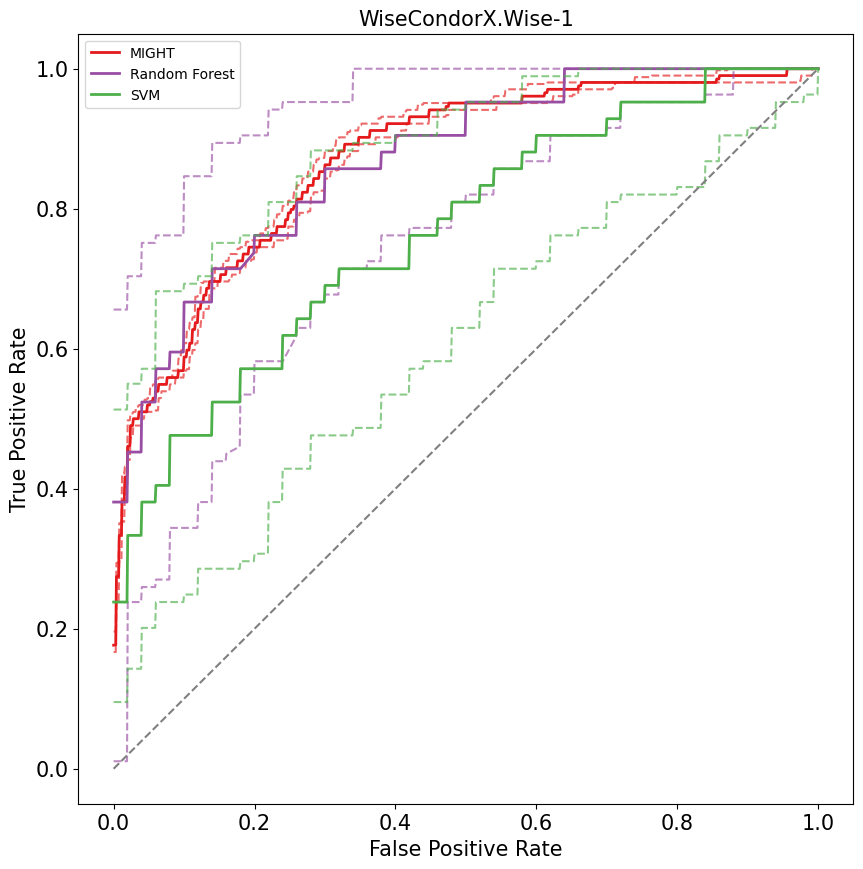

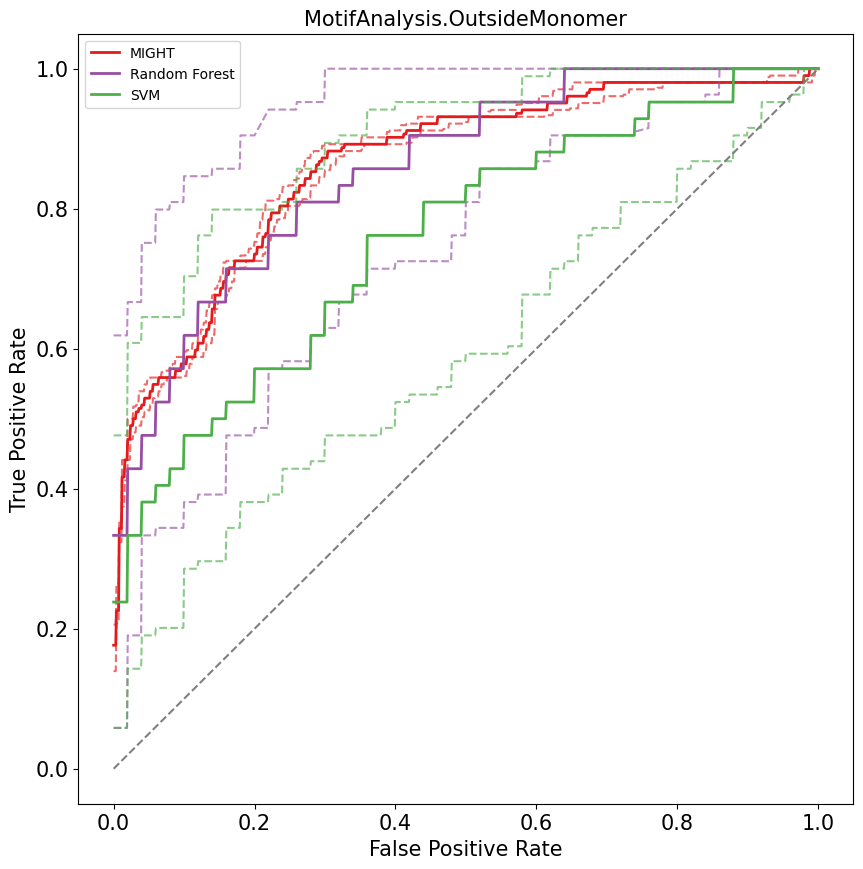

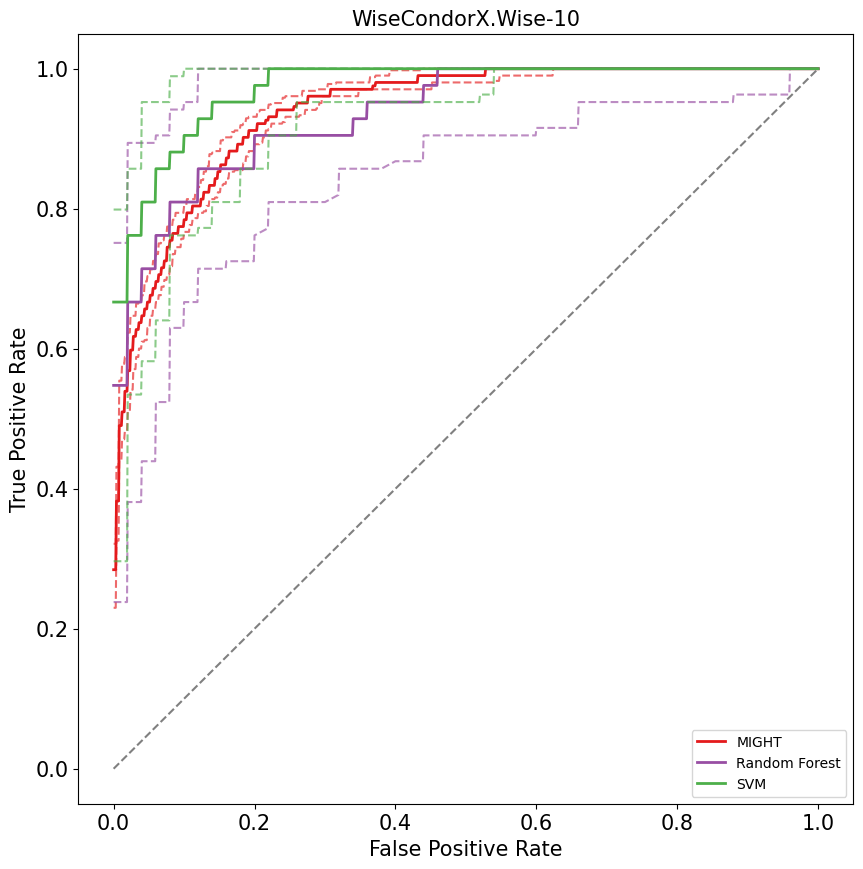

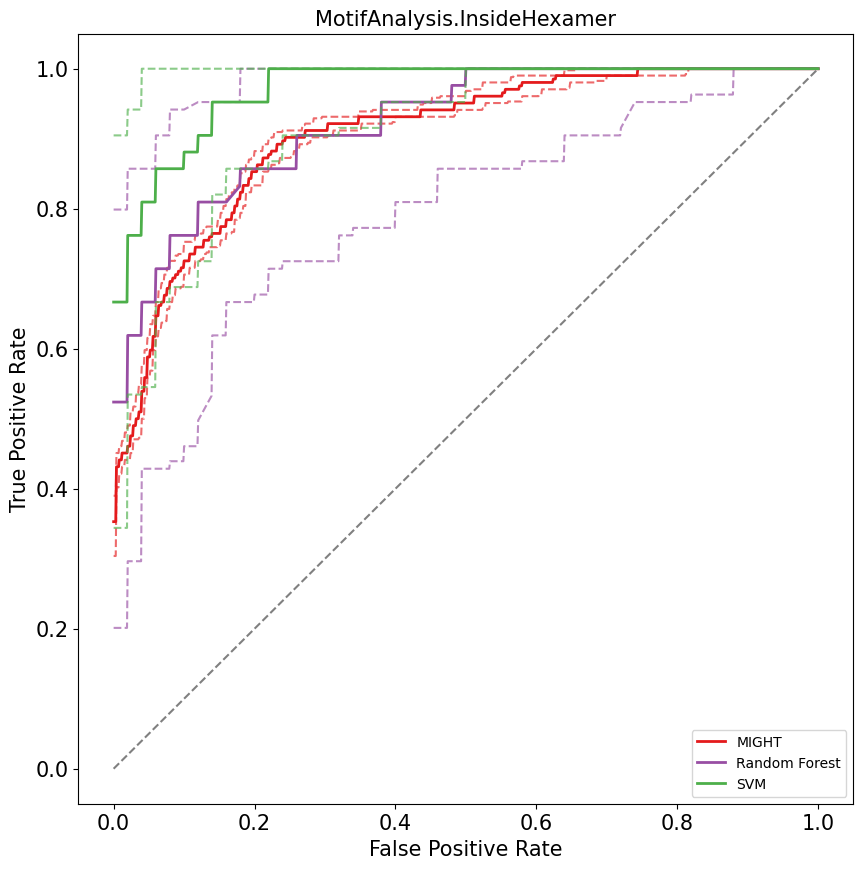

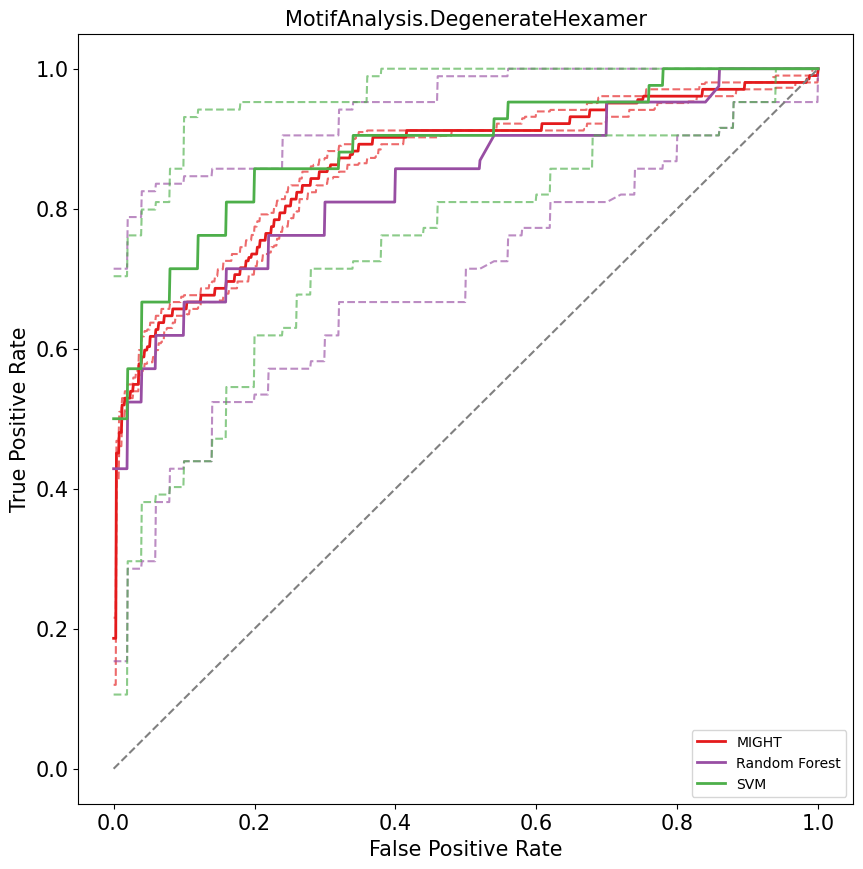

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
# set the style to Set1
sns.set_palette("Set1")
colors = sns.color_palette("Set1", n_colors=10,as_cmap=False)
colors[1], colors[3] = colors[3], colors[1]

FIG_DIR = "./results/figures/"
clf_names = [
    "MIGHT",
    "Random Forest",
    "SVM",
    # "Naive Bayes",
    # "Logistic Regression",
]
n_clf = len(clf_names)
# plot the ROC curve
base_fpr = np.linspace(0, 1, 1001)
N_ITR = int(len(fprs)/len(filelist))
fpr_ls = np.zeros((N_ITR, n_clf, 1001))
tpr_ls = np.zeros((N_ITR, n_clf, 1001))
feature_mean_s = []
n_files = len(filelist)
for i in range(len(filelist[:])):
    FEATURENAME = filelist[i].split(".csv")[0]
    if FEATURENAME not in top5_features:
        continue
    print(FEATURENAME)
    # initialize a figure
    fig, ax = plt.subplots(figsize=(10, 10))
    for j, clf_name_ in enumerate(clf_names):
        tpr_s = []
        for k in range(N_ITR):
            tpr = np.interp(base_fpr, fprs[n_files*k+i][j], tprs[n_files*k+i][j])
            tpr_s.append(tpr)
    # print(tpr.shape)
    # print(np.array(tpr_s).shape)
    # print(np.mean(tpr_s, axis=0).shape)
        # plot the tpr_s with confidence intervals
        ax.plot(base_fpr, np.median(tpr_s, axis=0), label=clf_names[j], color=colors[j], linewidth=2)
        # ax.plot(base_fpr, np.max(tpr_s, axis=0), label=clf_names[j]+"(max)", color=colors[j], alpha=0.5)
        # ax.plot(base_fpr, np.min(tpr_s, axis=0), label=clf_names[j]+"(min)", color=colors[j], alpha=0.5)
        ax.plot(base_fpr, np.percentile(tpr_s, 2.5, axis=0), color=colors[j], alpha=0.65, linestyle="--")
        ax.plot(base_fpr, np.percentile(tpr_s, 97.5, axis=0), color=colors[j], alpha=0.65, linestyle="--")
        # plot the confidence intervals
        # ax.fill_between(
        #     base_fpr,
        #     np.percentile(tpr_s, 2.5, axis=0),
        #     np.percentile(tpr_s, 97.5, axis=0),
        #     color=colors[j],
        #     alpha=0.2,
        # )
    plt.legend(fontsize=10)
    ax.plot([0,1], [0,1], "--", color="gray")
    ax.set_xlabel("False Positive Rate", fontsize=15)
    ax.set_ylabel("True Positive Rate", fontsize=15)
    ax.tick_params(axis="both", labelsize=15)
    plt.title(f"{FEATURENAME}", fontsize=15)
    # plt.savefig(FIG_DIR + "roc_" + str(FEATURENAME) + ".png", dpi=120)
    

19 WiseCondorX.Wise-1
20 MotifAnalysis.OutsideMonomer
22 WiseCondorX.Wise-10
23 MotifAnalysis.InsideHexamer
37 MotifAnalysis.DegenerateHexamer


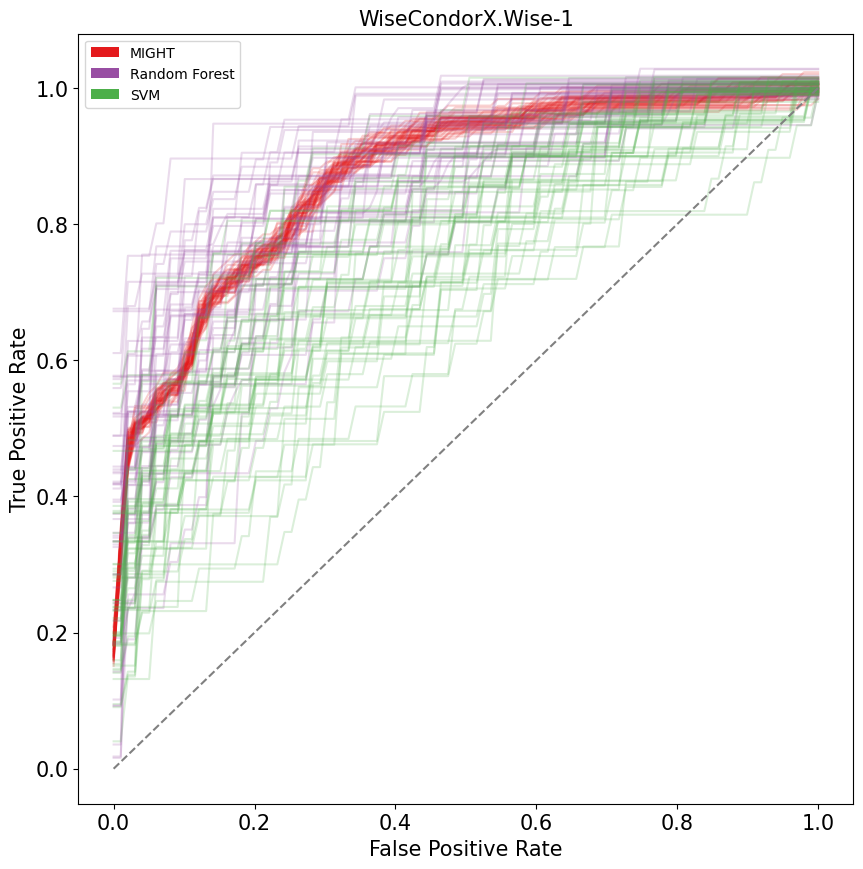

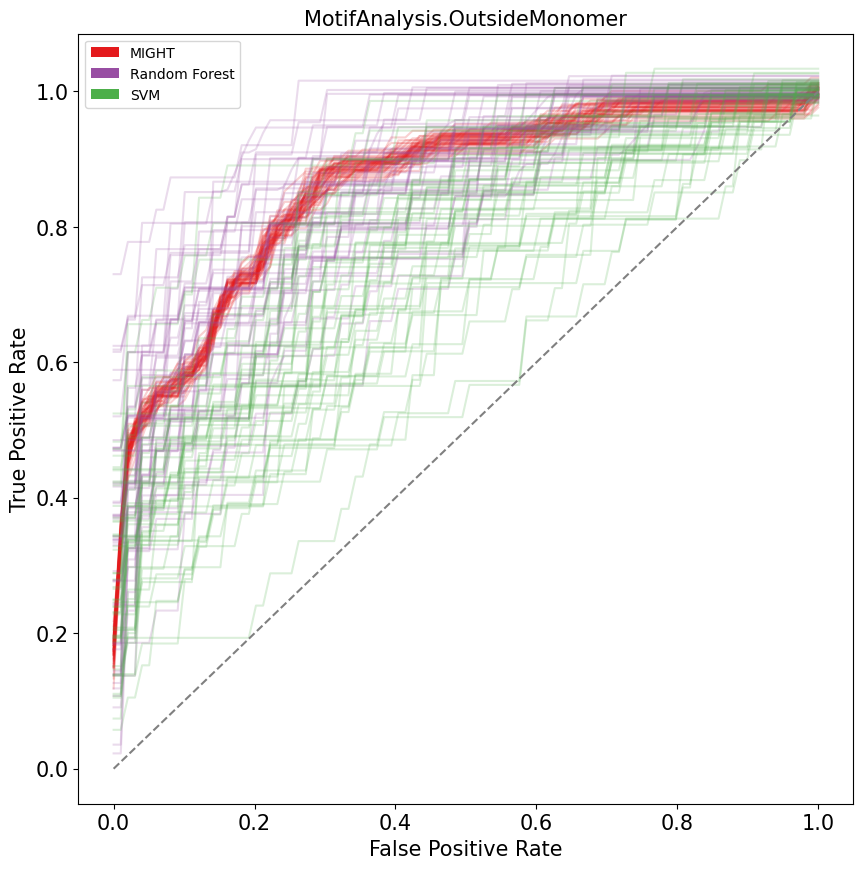

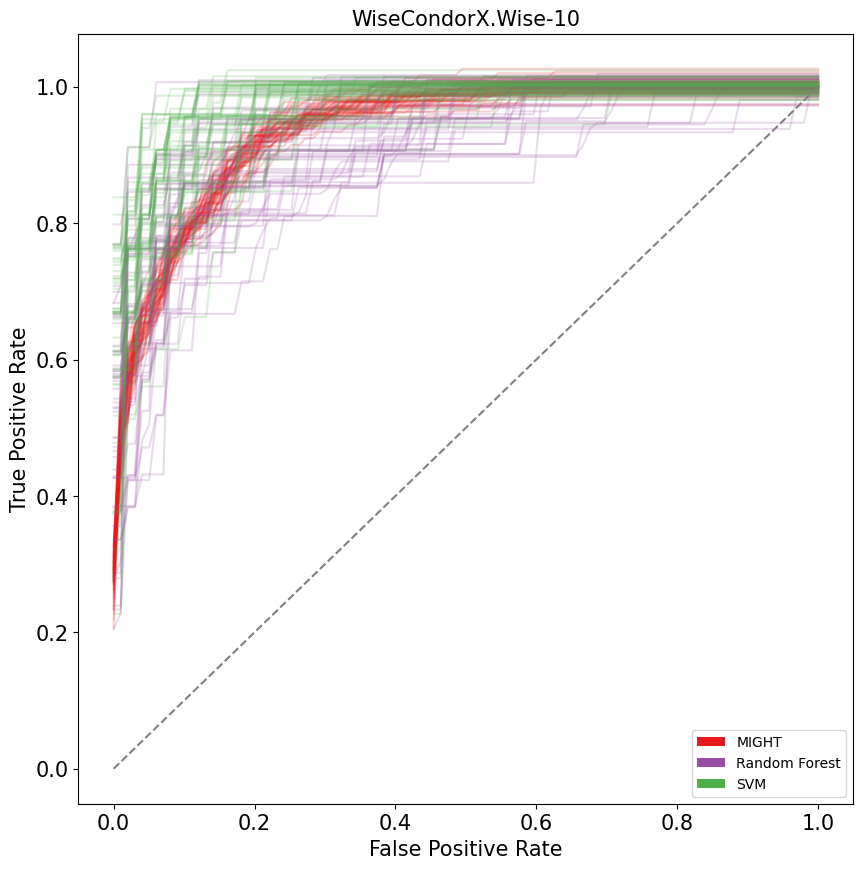

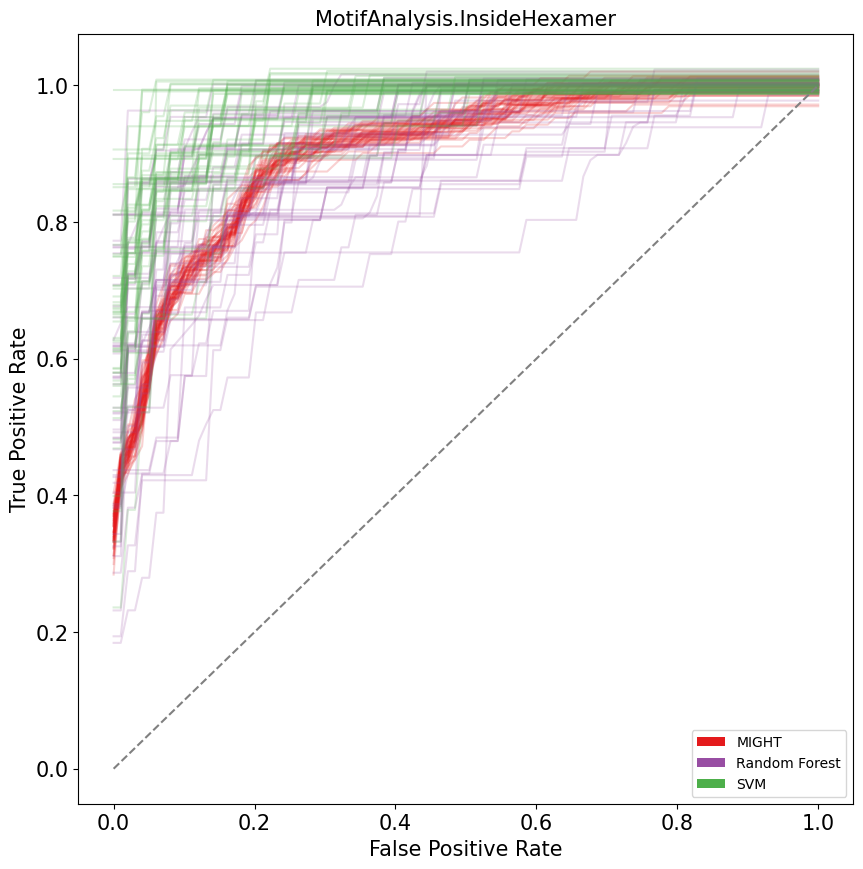

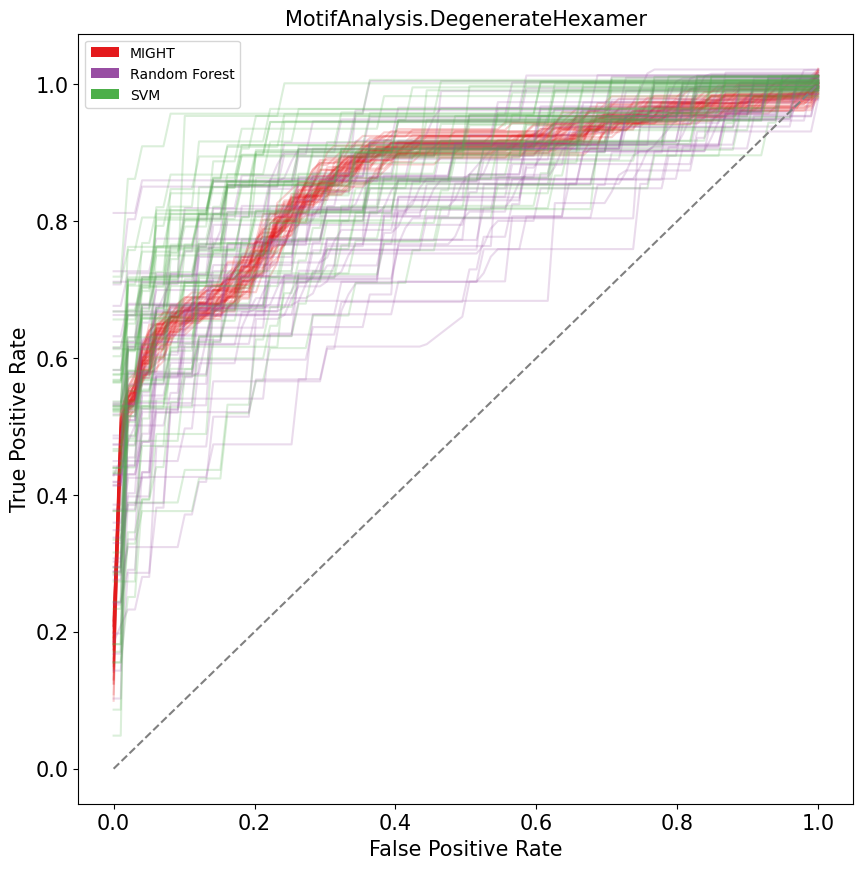

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch
# set the style to Set1
sns.set_palette("Set1")
colors = sns.color_palette("Set1", n_colors=10,as_cmap=False)
colors[1], colors[3] = colors[3], colors[1]

FIG_DIR = "./results/figures/"
clf_names = [
    "MIGHT",
    "Random Forest",
    "SVM",
    # "Naive Bayes",
    # "Logistic Regression",
]
n_clf = len(clf_names)
# plot the ROC curve
n_points = 100
base_fpr = np.linspace(0, 1, n_points)
N_ITR = int(len(fprs)/len(filelist))
fpr_ls = np.zeros((N_ITR, n_clf, n_points))
tpr_ls = np.zeros((N_ITR, n_clf, n_points))
feature_mean_s = []
n_files = len(filelist[:])
start = 0
end = n_files
for i, filename in enumerate(filelist[start:end]):
    FEATURENAME = filename.split(".csv")[0]
    if FEATURENAME not in top5_features:
        continue
    print(i, FEATURENAME)
    # initialize a figure
    fig, ax = plt.subplots(figsize=(10, 10))
    for j, clf_name_ in enumerate(clf_names):
        tpr_s = []
        for k in range(N_ITR):
            # add small noise to fprs to make jitter
            fprs_k = fprs[n_files*k+i][j] #+ np.random.normal(0, 0.01, len(fprs[n_files*k+i][j]))
            tprs_k = tprs[n_files*k+i][j] #+ np.random.normal(0, 0.01, len(tprs[n_files*k+i][j]))
            tpr = np.interp(base_fpr, fprs_k, tprs_k)
            tpr_s.append(tpr)
            # add small noise to tpr to make jitter
            # tpr = [tpr + np.random.normal(-0.01, 0.01, 1) for tpr in tpr]
            noise_ = np.random.normal(0, 0.01, 1)
            noise = noise_*np.ones(len(tpr)) # element-wise addition
            # element-wise addition
            tpr_noisy = [t + n for t, n in zip(tpr, noise)]
            base_fpr_noisy = [f + n for f, n in zip(base_fpr, noise)]
            ax.plot(base_fpr, tpr_noisy, color=colors[j], alpha=0.2)
    # print(tpr.shape)
    # print(np.array(tpr_s).shape)
    # print(np.mean(tpr_s, axis=0).shape)
        # plot the tpr_s with confidence intervals
        # ax.plot(base_fpr, np.mean(tpr_s, axis=0), label=clf_names[j], color=colors[j])
        # ax.plot(base_fpr, np.max(tpr_s, axis=0), label=clf_names[j]+"(max)", color=colors[j], alpha=0.2)
        # ax.plot(base_fpr, np.min(tpr_s, axis=0), label=clf_names[j]+"(min)", color=colors[j], alpha=0.2)
        # plot the confidence intervals
        # ax.fill_between(
        #     base_fpr,
        #     np.max(tpr_s, axis=0),
        #     np.min(tpr_s, axis=0),
        #     color=colors[j],
        #     alpha=0.3,
        # )
    # plt.legend(fontsize=10)
    # show custom legend for 3 lines

    # Create custom legend handles
    legend_handles = [Patch(facecolor=colors[j], label=clf_names[j],linestyle="-") for j in range(len(clf_names))]

    # Use the custom legend handles in plt.legend()
    plt.legend(handles=legend_handles, fontsize=10)
    ax.plot([0,1], [0,1], "--", color="gray")
    ax.set_xlabel("False Positive Rate", fontsize=15)
    ax.set_ylabel("True Positive Rate", fontsize=15)
    ax.tick_params(axis="both", labelsize=15)
    plt.title(f"{FEATURENAME}", fontsize=15)
    # plt.savefig(FIG_DIR + "roc_" + str(FEATURENAME) + ".png", dpi=120)
    

In [13]:
from matplotlib.patches import Patch

# Create custom legend handles
legend_handles = [Patch(facecolor=colors[j], label=clf_names[j]) for j in range(len(clf_names))]

# # Use the custom legend handles in plt.legend()
# plt.legend(handles=legend_handles, fontsize=10)

# Plot the TPR and FPR of each models as strip plots

In [14]:
from collections import defaultdict
# N_ITR = 5
FIG_DIR = "./results/figures/"
clf_name = [
    "MIGHT",
    "Random Forest",
    "SVM",
    "Naive Bayes",
    "Logistic Regression",
]
n_clf = len(clf_name)
base_fpr = np.linspace(0, 1, 1001)
max_fpr = 0.02
# create a dataframe to store the results
results_per_feature = pd.DataFrame()
D_sa98 = defaultdict()
n_files = len(filelist)
for i in range(n_files):
    FEATURENAME = filelist[i].split(".csv")[0]
    # print(i, FEATURENAME)
    d_sa98 = defaultdict(list)
    for j, clf in enumerate(clf_name):
        for k in range(N_ITR):
            tpr = np.interp(base_fpr, fprs[i+n_files*k][j], tprs[i+n_files*k][j])
            d_sa98[clf].append(max([tpr for (base_fpr, tpr) in zip(base_fpr, tpr) if base_fpr <= max_fpr]))
    D_sa98[FEATURENAME] = d_sa98

In [15]:
# N_ITR = 5
FIG_DIR = "./results/figures/"
clf_name = [
    "MIGHT",
    "Random Forest",
    "SVM",
    "Naive Bayes",
    "Logistic Regression",
]
n_clf = len(clf_name)
base_fpr = np.linspace(0, 1, 1001)
max_fpr = 0.02
# create a dataframe to store the results
results = pd.DataFrame()
results_per_run = pd.DataFrame()
for i in range(len(filelist)):
    FEATURENAME = filelist[i].split(".csv")[0]
    print(i, FEATURENAME)
    for j in range(n_clf):
        fpr_cv = []
        tpr_ = []
        tpr_cv = []
        sa98_ = []
        for k in range(N_ITR):
            tpr = np.interp(base_fpr, fprs[i+n_files*k][j], tprs[i+n_files*k][j])
            # print(tpr)
            tpr_i = np.mean(tpr, axis=0)
            tpr_.append(tpr_i)
            # tpr_std = np.std(tpr, axis=0)
            sa98_i = max([tpr for (base_fpr, tpr) in zip(base_fpr, tpr) if base_fpr <= max_fpr])
            sa98_.append(sa98_i)
            # add noise
            sa98_i += np.random.normal(0, 0.01, 1)[0]
            row = {
            "Feature": FEATURENAME,
            "Classifier": clf_name[j],
            "sa98": sa98_i,
            "tpr": tpr_i,
            }
            tpr_cv.extend(tpr)
            fpr_cv.extend(base_fpr)
            results_per_run = results_per_run._append(row, ignore_index=True)
        tpr_mean = np.mean(tpr_)
        sa98_cv = max([tpr for (base_fpr, tpr) in zip(fpr_cv, tpr_cv) if base_fpr <= max_fpr])
        sa98 = np.mean(sa98_)
        # print( " "*5, j+1, clf_name[j])
        # print(" "*10, "sa98:", sa98)
        # print(" "*10, "sa98_cv:", sa98_cv)
        # print(" "*10, "tpr:", tpr_mean)
        # add the results to the dataframe
        row = {
            "Feature": FEATURENAME,
            "Classifier": clf_name[j],
            "sa98_mean": sa98,
            "sa98_cv": sa98_cv,
            "tpr": tpr_mean,
        }
        results = results._append(row, ignore_index=True)
# display(results)
# sort the results s.t. the Classifier is in the order of ["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]
df = results.set_index("Classifier").loc[["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]].sort_values("Feature").reset_index()
display(df)
# get the top 5 features based on sa98 mean of MIGHT
top5_features = list(df[df["Classifier"] == "MIGHT"].sort_values("sa98_mean", ascending=False)[:5]["Feature"])
print(top5_features)


0 Delfi.LengthRatio
1 MotifAnalysis.OutsideTrimer
2 MotifAnalysis.OutsideDimer
3 DyadAccessibility.LINEs
4 LociFraction.cCREFraction
5 MotifAnalysis.InsideMonomer
6 LengthAnalysis.Length20
7 MotifAnalysis.InsideDimer
8 DyadAccessibility.cCRE_CTCF
9 LociFraction.CompartmentFraction
10 LociFraction.LINEsFraction
11 DyadAccessibility.cCRE_DistalEnhancers
12 MotifAnalysis.CongruentTetramer
13 LengthAnalysis.Length5
14 MotifAnalysis.OutsideTetramer
15 WiseCondorX.Wise-5
16 MotifAnalysis.InsidePentamer
17 MotifAnalysis.CongruentHexamer
18 DyadAccessibility.AluS
19 WiseCondorX.Wise-1
20 MotifAnalysis.OutsideMonomer
21 LengthAnalysis.Length1
22 WiseCondorX.Wise-10
23 MotifAnalysis.InsideHexamer
24 MotifAnalysis.InsideTetramer
25 MotifAnalysis.InsideTrimer
26 DyadAccessibility.AluJ
27 MotifAnalysis.OutsidePentamer
28 MotifAnalysis.CongruentDimer
29 MotifAnalysis.DegenerateTetramer
30 ichorCNA.ichorCNA
31 DyadAccessibility.BudhrajaRPR
32 DyadAccessibility.cCRE_Promoters
33 DyadAccessibility.AluY

,Classifier,Feature,sa98_mean,sa98_cv,tpr
0,MIGHT,Delfi.LengthRatio,0.380784,0.382353,0.740158
1,SVM,Delfi.LengthRatio,0.380952,0.523810,0.658075
2,Random Forest,Delfi.LengthRatio,0.328571,0.476190,0.711175
3,Logistic Regression,Delfi.LengthRatio,0.217143,0.428571,0.659769
4,Naive Bayes,Delfi.LengthRatio,0.402857,0.761905,0.710347
...,...,...,...,...,...
215,Random Forest,ichorCNA.ichorCNA,0.365714,0.619048,0.730825
216,SVM,ichorCNA.ichorCNA,0.325714,0.571429,0.737995
217,MIGHT,ichorCNA.ichorCNA,0.313333,0.323529,0.749091
218,Logistic Regression,ichorCNA.ichorCNA,0.276190,0.523810,0.727815


['WiseCondorX.Wise-10', 'MotifAnalysis.DegenerateHexamer', 'MotifAnalysis.OutsideMonomer', 'WiseCondorX.Wise-1', 'MotifAnalysis.InsideHexamer']


In [39]:
# display(results)
# sort the results s.t. the Classifier is in the order of ["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]
df_per_run = results_per_run.set_index("Classifier").loc[["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]].sort_values("Feature").reset_index()
display(df_per_run)

,Classifier,Feature,sa98,tpr
0,MIGHT,Delfi.LengthRatio,0.379920,0.739711
1,Naive Bayes,Delfi.LengthRatio,0.288228,0.653680
2,Naive Bayes,Delfi.LengthRatio,0.278008,0.662243
3,Naive Bayes,Delfi.LengthRatio,0.406003,0.642262
4,Naive Bayes,Delfi.LengthRatio,0.334569,0.744065
...,...,...,...,...
10995,Naive Bayes,ichorCNA.ichorCNA,0.039593,0.586152
10996,Naive Bayes,ichorCNA.ichorCNA,0.152389,0.712644
10997,Naive Bayes,ichorCNA.ichorCNA,0.102894,0.679844
10998,Naive Bayes,ichorCNA.ichorCNA,0.268319,0.742163


<Figure size 1500x1000 with 0 Axes>

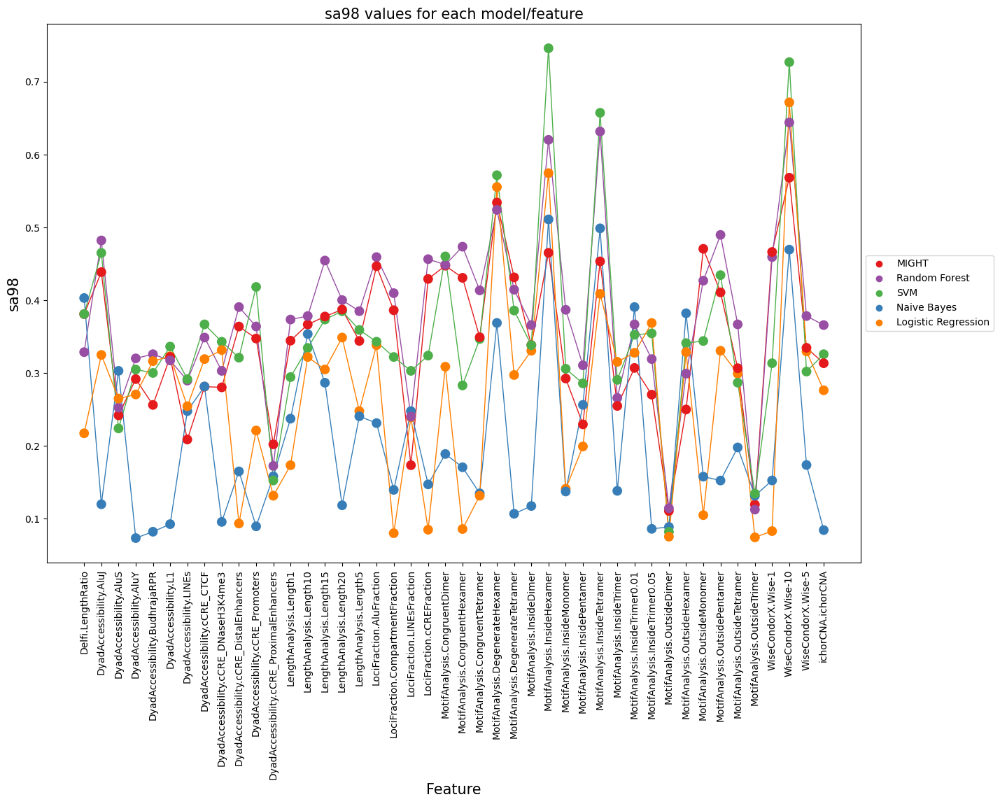

In [40]:
# plot as a stripplot with the sa98 values for each feature
plt.figure(figsize=(15, 10))
# Define a custom color mapping for classifiers
colors = sns.color_palette("Set1", 5)
colors[1], colors[3] = colors[3], colors[1]
color_mapping = {
    "MIGHT": colors[0],
    "Random Forest": colors[1],
    "SVM": colors[2],
    "Naive Bayes": colors[3],
    "Logistic Regression": colors[4],
}

# Create a list of colors in the order of the classifiers appearing in the data
# This ensures that each classifier is colored according to the custom mapping
classifier_colors = [color_mapping[classifier] for classifier in results["Classifier"].unique()]
# sns.set_palette(classifier_colors)
plt.figure(figsize=(15, 10))
# Apply the custom color palette
# sns.set_palette(classifier_colors)
# sort the results by the feature name
features = df["Feature"].unique()
classifiers = [ "MIGHT", "Random Forest", "SVM","Naive Bayes", "Logistic Regression"]#df["Classifier"].unique()
# change the hues so the "MIGHT" is red, "Random Forest" is blue, "SVM" is green, "Naive Bayes" is orange, and "Logistic Regression" is purple

sns.stripplot(x="Feature", y="sa98_mean", hue="Classifier", data=df, jitter=False, dodge=False, size=10, order=features, hue_order=classifiers, palette=colors)
# Manually specify the order and labels for the legend
# legend_order = ["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]
# legend_colors = [color_mapping[classifier] for classifier in legend_order]

# Create custom legend
# custom_legend = [plt.Line2D([0], [0], color=color, marker='o', linestyle='', markersize=10) for color in legend_colors]
plt.legend()
# plot the sa98 values for each classifier
for i, classifier in enumerate(classifiers):
    classifier_data = df[df["Classifier"] == classifier]
    y_values = classifier_data["sa98_mean"].values
    # Get the x-values (positions) for the current feature across classifiers
    # This assumes the classifiers are evenly spaced and ordered
    x_values = np.arange(len(features))
    # Draw lines between the points for the current feature
    plt.plot(x_values, y_values, color=colors[i], linestyle='-', linewidth=1)

# for i, classifier in enumerate(classifiers):
#     classifier_data_per_run = df_per_run[df_per_run["Classifier"] == classifier]
#     sns.stripplot(x="Feature", y="sa98", hue="Classifier", data=classifier_data_per_run, jitter=False, dodge=False, size=5, order=features, hue_order=classifiers)
   
plt.xticks(rotation=90)
plt.xlabel("Feature", fontsize=15)
plt.ylabel("sa98", fontsize=15)
# move the legend to the right
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("sa98 values for each model/feature", fontsize=15)
# save the plot
plt.savefig(FIG_DIR + "cancer44_sa98_stripplot.png", dpi=120)



In [51]:
# # plot as a stripplot with the sa98 values for each feature
# plt.figure(figsize=(15, 10))
# # Define a custom color mapping for classifiers
# color_mapping = {
#     "MIGHT": "red",
#     "Random Forest": "blue",
#     "SVM": "green",
#     "Naive Bayes": "purple",
#     "Logistic Regression": "orange"
# }

# # Create a list of colors in the order of the classifiers appearing in the data
# # This ensures that each classifier is colored according to the custom mapping
# classifier_colors = [color_mapping[classifier] for classifier in results["Classifier"].unique()]
# # sns.set_palette(classifier_colors)
# plt.figure(figsize=(15, 10))
# # Apply the custom color palette
# # sns.set_palette(classifier_colors)
# # sort the results by the feature name
# features = df["Feature"].unique()
# classifiers = [ "MIGHT", "Random Forest", "SVM","Naive Bayes", "Logistic Regression"]#df["Classifier"].unique()
# # change the hues so the "MIGHT" is red, "Random Forest" is blue, "SVM" is green, "Naive Bayes" is orange, and "Logistic Regression" is purple
# sns.set_palette(sns.color_palette("Set1", 5))
# sns.stripplot(x="Feature", y="sa98_cv", hue="Classifier", data=df, jitter=False, dodge=False, size=10, order=features, hue_order=classifiers, palette=colors)
# # Manually specify the order and labels for the legend
# # legend_order = ["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]
# # legend_colors = [color_mapping[classifier] for classifier in legend_order]

# # Create custom legend
# # custom_legend = [plt.Line2D([0], [0], color=color, marker='o', linestyle='', markersize=10) for color in legend_colors]
# plt.legend()
# # plot the sa98 values for each classifier
# for i, classifier in enumerate(classifiers):
#     classifier_data = df[df["Classifier"] == classifier]
#     y_values = classifier_data["sa98_cv"].values
#     # Get the x-values (positions) for the current feature across classifiers
#     # This assumes the classifiers are evenly spaced and ordered
#     x_values = np.arange(len(features))
#     # Draw lines between the points for the current feature
#     plt.plot(x_values, y_values, color=colors[i], linestyle='-', linewidth=1)

# # for i, classifier in enumerate(classifiers):
# #     classifier_data_per_run = df_per_run[df_per_run["Classifier"] == classifier]
# #     sns.stripplot(x="Feature", y="sa98", hue="Classifier", data=classifier_data_per_run, jitter=False, dodge=False, size=5, order=features, hue_order=classifiers)
   
# plt.xticks(rotation=90)
# plt.xlabel("Feature", fontsize=15)
# plt.ylabel("sa98", fontsize=15)
# # move the legend to the right
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
# plt.title("sa98 for 5 CV values for each model/feature", fontsize=15)
# # save the plot
# plt.savefig(FIG_DIR + "cancer44_sa98_stripplot.png", dpi=120)



<Figure size 1500x1000 with 0 Axes>

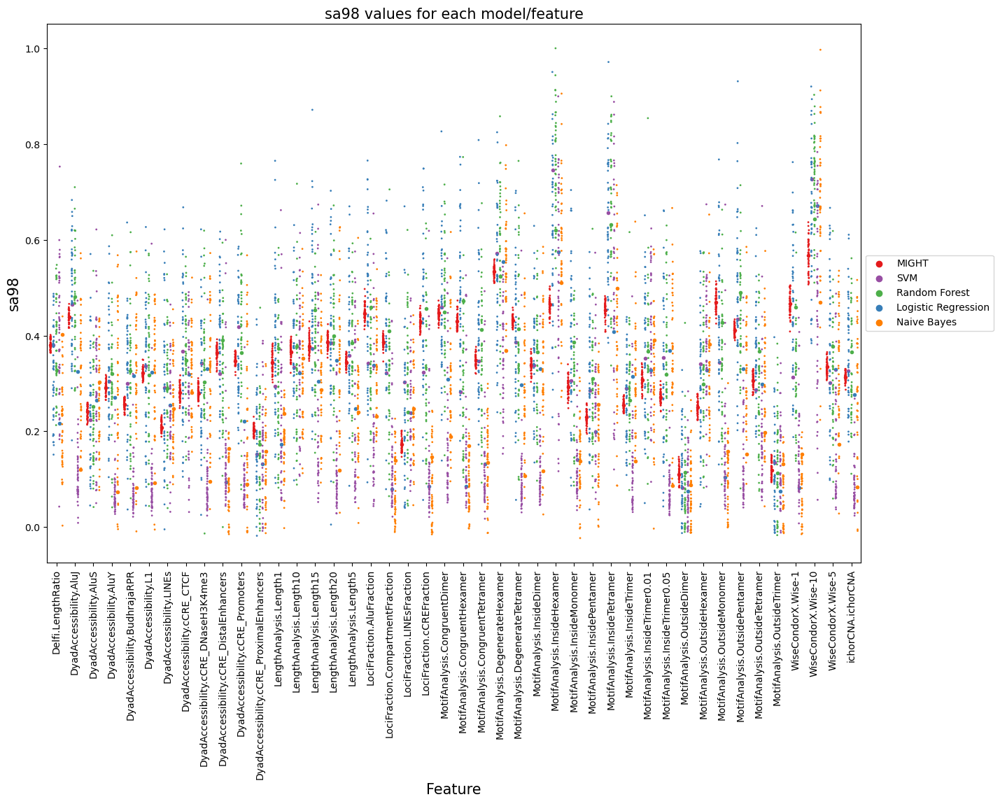

In [50]:
# plot as a stripplot with the sa98 values for each feature
plt.figure(figsize=(15, 10))
# Define a custom color mapping for classifiers
color_mapping = {
    "MIGHT": "red",
    "Random Forest": "blue",
    "SVM": "green",
    "Naive Bayes": "purple",
    "Logistic Regression": "orange"
}

# Create a list of colors in the order of the classifiers appearing in the data
# This ensures that each classifier is colored according to the custom mapping
classifier_colors = [color_mapping[classifier] for classifier in results["Classifier"].unique()]
# sns.set_palette(classifier_colors)
plt.figure(figsize=(15, 10))
# Apply the custom color palette
# sns.set_palette(classifier_colors)
# sort the results by the feature name
features = df["Feature"].unique()
classifiers = [ "MIGHT", "Random Forest", "SVM","Naive Bayes", "Logistic Regression"]#df["Classifier"].unique()
# change the hues so the "MIGHT" is red, "Random Forest" is blue, "SVM" is green, "Naive Bayes" is orange, and "Logistic Regression" is purple
# sns.set_palette(sns.color_palette("Set1", 5))
sns.stripplot(x="Feature", y="sa98_mean", hue="Classifier", data=df, jitter=True, dodge=True, size=4, order=features, palette=colors)
# Manually specify the order and labels for the legend
# legend_order = ["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]
# legend_colors = [color_mapping[classifier] for classifier in legend_order]

# Create custom legend
# custom_legend = [plt.Line2D([0], [0], color=color, marker='o', linestyle='', markersize=10) for color in legend_colors]
plt.legend()
# plot the sa98 values for each classifier
# for i, classifier in enumerate(classifiers):
#     classifier_data = df[df["Classifier"] == classifier]
#     y_values = classifier_data["sa98_mean"].values
#     # Get the x-values (positions) for the current feature across classifiers
#     # This assumes the classifiers are evenly spaced and ordered
#     x_values = np.arange(len(features))
#     # Draw lines between the points for the current feature
#     plt.plot(x_values, y_values, color=colors[i], linestyle='-', linewidth=1)

for i, classifier in enumerate(classifiers):
    classifier_data_per_run = df_per_run[df_per_run["Classifier"] == classifier]
    sns.stripplot(x="Feature", y="sa98", hue="Classifier", data=classifier_data_per_run, jitter=True, dodge=True, size=2, order=features, hue_order=classifiers,legend=False)
   
plt.xticks(rotation=90)
plt.xlabel("Feature", fontsize=15)
plt.ylabel("sa98", fontsize=15)
# move the legend to the right
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title("sa98 values for each model/feature", fontsize=15)
# save the plot
plt.savefig(FIG_DIR + "cancer44_sa98_stripplot.png", dpi=120)



Text(0.5, 1.0, 'sa98 values for each model/feature')

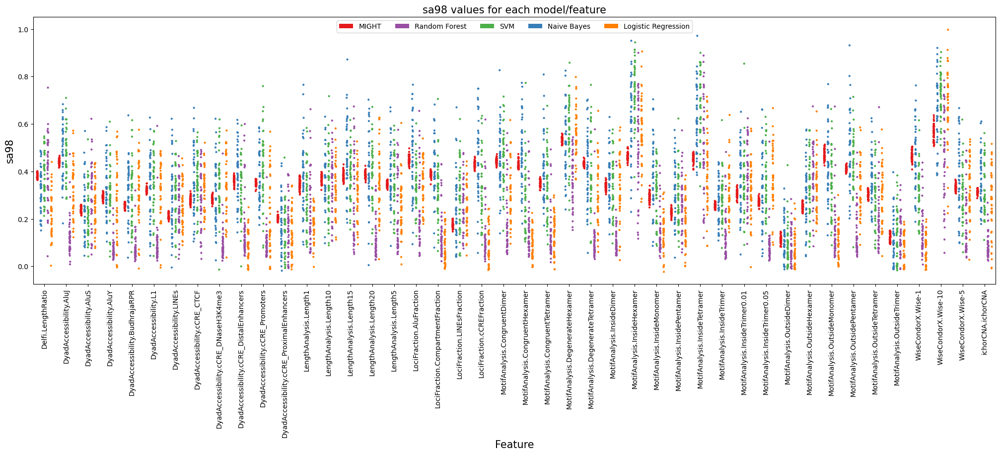

In [43]:
# plot as a stripplot with the sa98 values for each feature
plt.figure(figsize=(25, 7))
# Define a custom color mapping for classifiers
color_mapping = {
    "MIGHT": "red",
    "Random Forest": "blue",
    "SVM": "green",
    "Naive Bayes": "purple",
    "Logistic Regression": "orange"
}

# Create a list of colors in the order of the classifiers appearing in the data
# This ensures that each classifier is colored according to the custom mapping
classifier_colors = [color_mapping[classifier] for classifier in results["Classifier"].unique()]
# sns.set_palette(classifier_colors)
# Apply the custom color palette
# sns.set_palette(classifier_colors)
# sort the results by the feature name
features = df["Feature"].unique()
classifiers = [ "MIGHT", "Random Forest", "SVM","Naive Bayes", "Logistic Regression"]#df["Classifier"].unique()
# change the hues so the "MIGHT" is red, "Random Forest" is blue, "SVM" is green, "Naive Bayes" is orange, and "Logistic Regression" is purple
sns.set_palette(sns.color_palette("Set1", 5))
# sns.stripplot(x="Feature", y="sa98", hue="Classifier", data=df, jitter=False, dodge=False, size=10, order=features, hue_order=classifiers)
# # Manually specify the order and labels for the legend
# # legend_order = ["MIGHT", "Random Forest", "SVM", "Naive Bayes", "Logistic Regression"]
# # legend_colors = [color_mapping[classifier] for classifier in legend_order]

# # Create custom legend
# # custom_legend = [plt.Line2D([0], [0], color=color, marker='o', linestyle='', markersize=10) for color in legend_colors]
# plt.legend()
# # plot the sa98 values for each classifier
# for classifier in classifiers:
#     classifier_data = df[df["Classifier"] == classifier]
#     y_values = classifier_data["sa98"].values
#     # Get the x-values (positions) for the current feature across classifiers
#     # This assumes the classifiers are evenly spaced and ordered
#     x_values = np.arange(len(features))
#     # Draw lines between the points for the current feature
#     plt.plot(x_values, y_values, color="gray", linestyle='-', linewidth=1)

for i, classifier in enumerate(classifiers):
    classifier_data_per_run = df_per_run[df_per_run["Classifier"] == classifier]
    sns.stripplot(x="Feature", y="sa98", hue="Classifier", data=classifier_data_per_run, jitter=True, dodge=True, size=3, order=features, hue_order=classifiers,legend=False)
   
plt.xticks(rotation=90)
plt.xlabel("Feature", fontsize=15)
plt.ylabel("sa98", fontsize=15)
# move the legend to the right

legend_handles = [Patch(facecolor=colors[j], label=classifiers[j]) for j in range(len(classifiers))]
plt.legend(handles=legend_handles, fontsize=10, ncol=5, loc='upper center')
plt.title("sa98 values for each model/feature", fontsize=15)
# save the plot
# plt.savefig(FIG_DIR + "cancer44_sa98_stripplot.png", dpi=120)



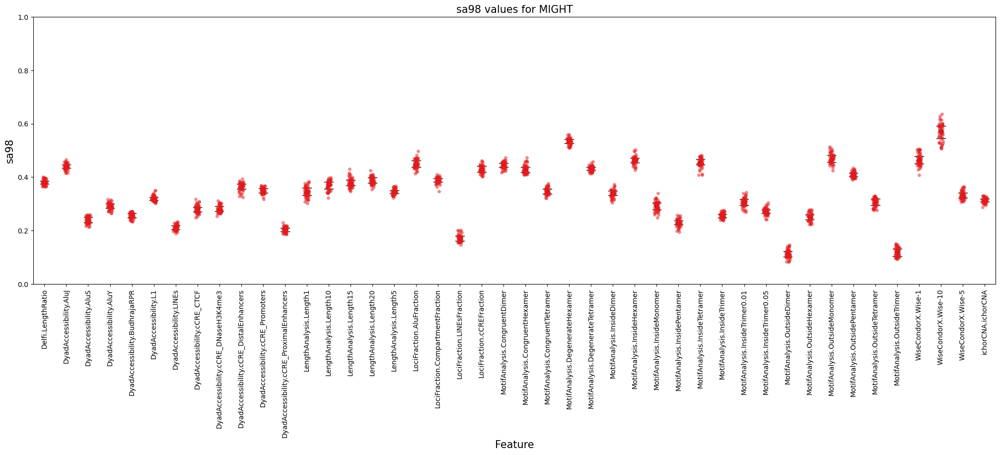

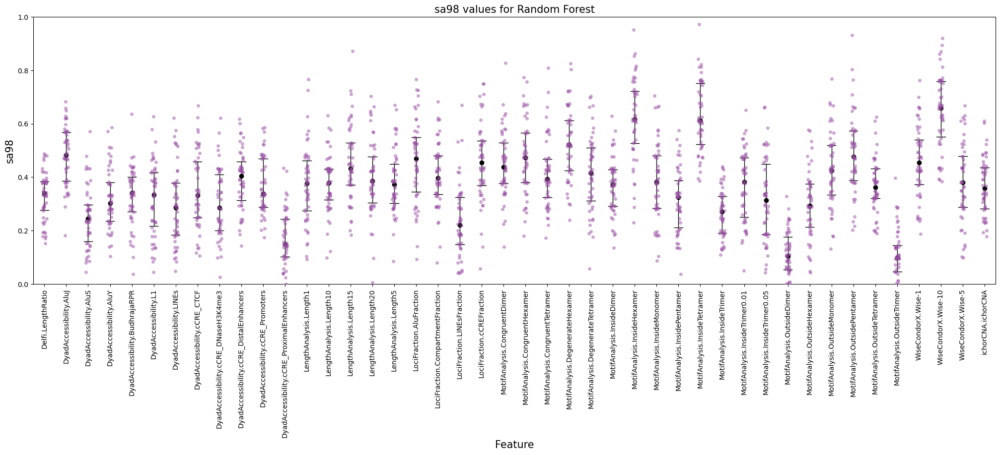

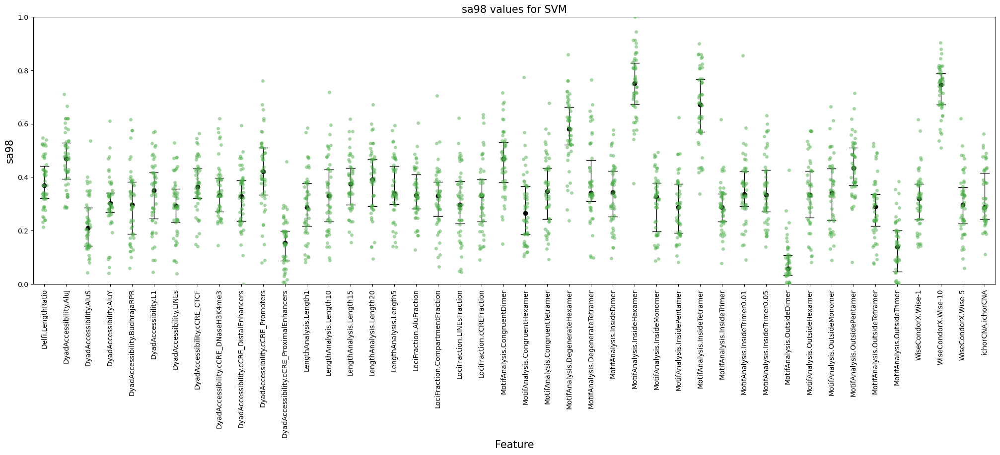

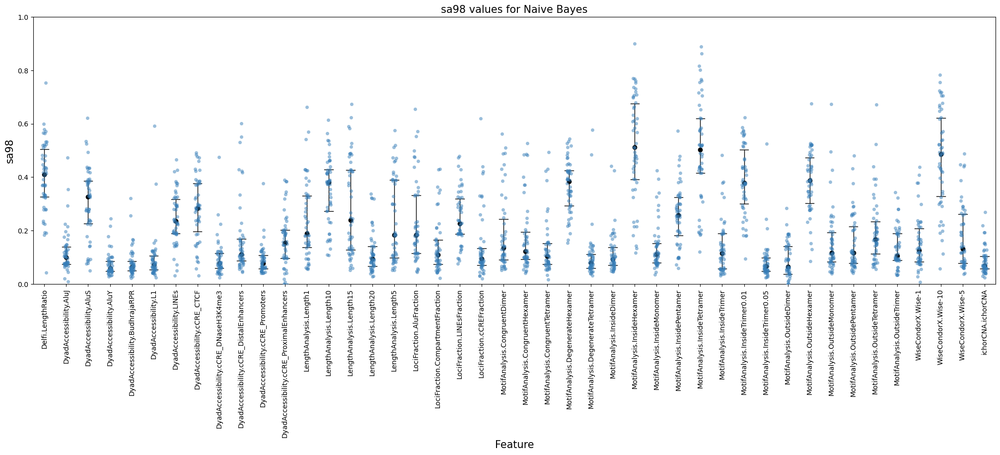

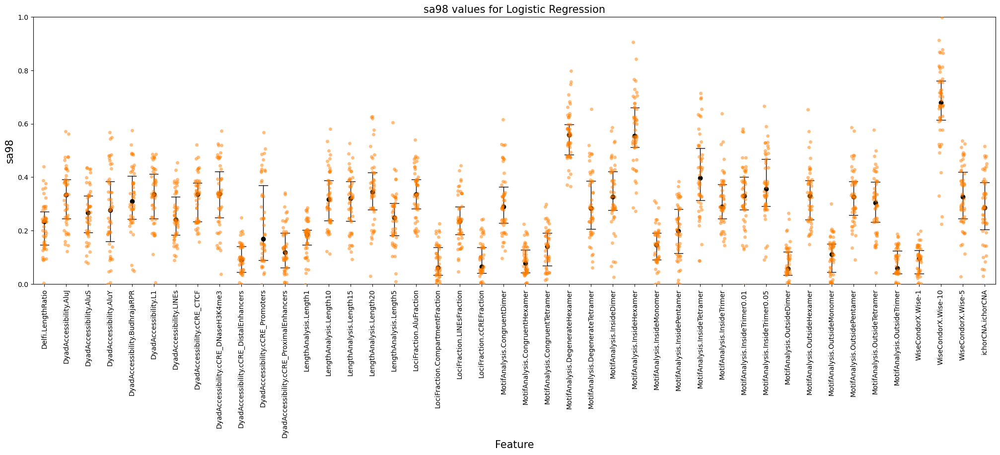

In [49]:
# make separate plots for each classifier
for i, classifier in enumerate(classifiers):
    classifier_data_per_run = df_per_run[df_per_run["Classifier"] == classifier]
    plt.figure(figsize=(25, 7))
    
    # add IQR lines for each feature
    for j, feature in enumerate(features):
        feature_data = classifier_data_per_run[classifier_data_per_run["Feature"] == feature]
        # get the 25th and 75th percentile
        q1 = feature_data["sa98"].quantile(0.25)
        q3 = feature_data["sa98"].quantile(0.75)
        # get the median
        median = feature_data["sa98"].median()
        # plot the IQR lines
        plt.plot([j-0.2, j+0.2], [q1, q1], color="black", linewidth=1)
        plt.plot([j-0.2, j+0.2], [q3, q3], color="black", linewidth=1)
        plt.plot([j, j], [q1, q3], color="black", linewidth=1)
        # plot the median
        plt.plot(j, median, marker="o", color="black")
    sns.stripplot(x="Feature", y="sa98", data=classifier_data_per_run, jitter=True, dodge=True, size=5, order=features, color=colors[i], alpha=0.5)
    # make the y-axis range from 0 to 1
    plt.ylim(0, 1)
    plt.xticks(rotation=90)
    plt.xlabel("Feature", fontsize=15)
    plt.ylabel("sa98", fontsize=15)
    plt.title(f"sa98 values for {classifier}", fontsize=15)
    plt.savefig(FIG_DIR + f"cancer44_{classifier}_sa98_stripplot.png", dpi=120)
    plt.show()

Text(0.5, 1.0, 'sa98 values for each model/feature')

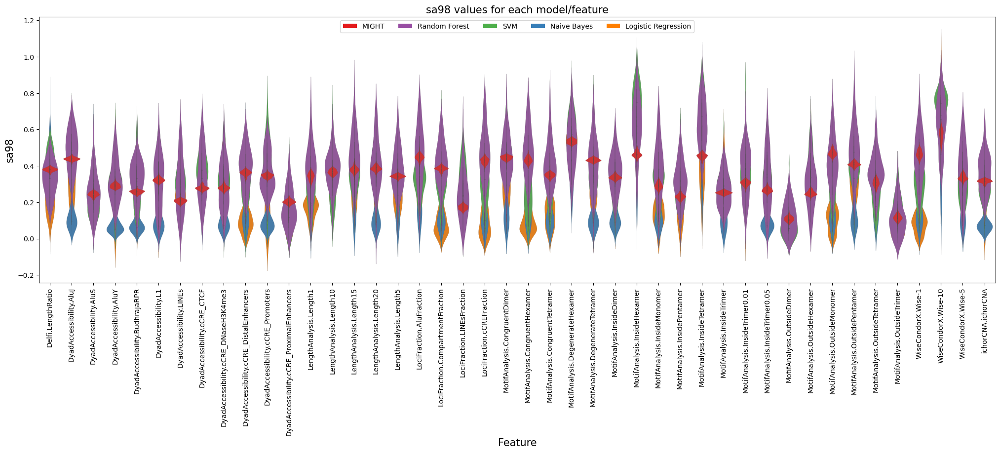

In [21]:
# convert above plot to a violin plot
plt.figure(figsize=(25, 7))
# sort the results by the feature name
features = df["Feature"].unique()
classifiers = [ "MIGHT", "Random Forest", "SVM","Naive Bayes", "Logistic Regression"]#df["Classifier"].unique()
# change the hues so the "MIGHT" is red, "Random Forest" is blue, "SVM" is green, "Naive Bayes" is orange, and "Logistic Regression" is purple
# sns.set_palette(sns.color_palette("Set1", 5))
for i, classifier in enumerate(classifiers[::-1]):
    classifier_data_per_run = df_per_run[df_per_run["Classifier"] == classifier]
    # sns.stripplot(x="Feature", y="sa98", hue="Classifier", data=classifier_data_per_run, jitter=True, dodge=True, size=3, order=features, hue_order=classifiers,legend=False)
    sns.violinplot(x="Feature", y="sa98", data=classifier_data_per_run, order=features, color=colors[::-1][i], alpha=0.5, dodge=True, linewidth=.1)
   
plt.xticks(rotation=90)
plt.xlabel("Feature", fontsize=15)
plt.ylabel("sa98", fontsize=15)

legend_handles = [Patch(facecolor=colors[j], label=classifiers[j]) for j in range(len(classifiers))]
plt.legend(handles=legend_handles, fontsize=10, ncol=5, loc='upper center')
plt.title("sa98 values for each model/feature", fontsize=15)
# save the plot
# plt.savefig(FIG_DIR + "cancer44_sa98_stripplot.png", dpi=120)

Text(0.5, 1.0, 'sa98 values for each model/feature')

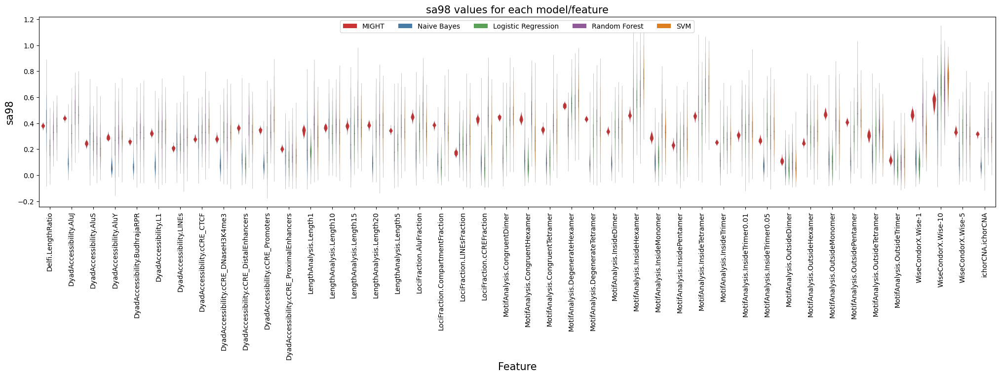

In [22]:
df_plt1= df_per_run.melt(id_vars=["Feature", "Classifier"], value_vars=["sa98"], var_name="Metric", value_name="Value")
# plot boxplot for each Feature/Classifier combination
plt.figure(figsize=(25, 5))
sns.violinplot(x="Feature", y="Value", hue="Classifier", data=df_plt1, dodge=True, linewidth=.1)
plt.xticks(rotation=90)
plt.xlabel("Feature", fontsize=15)
plt.ylabel("sa98", fontsize=15)
plt.legend(fontsize=10, ncol=5, loc='upper center')
plt.title("sa98 values for each model/feature", fontsize=15)


Text(0.5, 1.0, 'sa98 values for each model/feature')

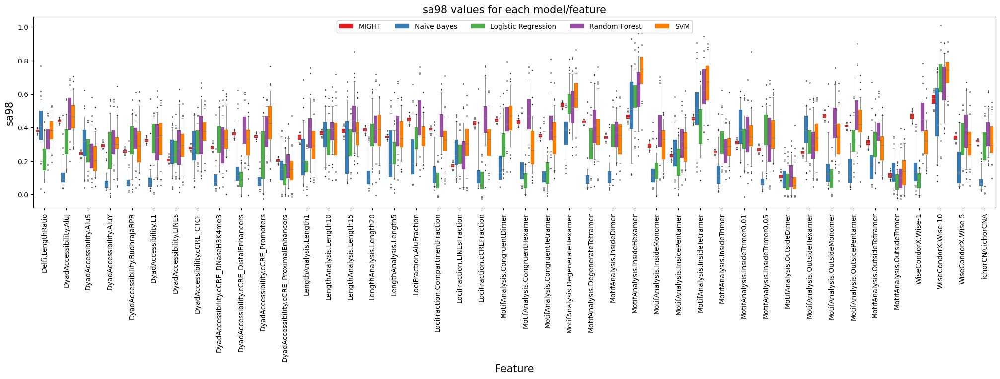

In [23]:
df_plt1 = df_per_run.melt(
    id_vars=["Feature", "Classifier"],
    value_vars=["sa98"],
    var_name="Metric",
    value_name="Value",
)
# plot boxplot for each Feature/Classifier combination
fig, ax = plt.subplots(figsize=(25, 5))
sns.boxplot(
    x="Feature",
    y="Value",
    hue="Classifier",
    data=df_plt1,
    dodge=True,
    linewidth=0.4,
    whis=(5, 95),
    saturation=1,
    fliersize=1,
    medianprops=dict(linestyle="-", linewidth=1, color="gray"),
    boxprops=dict(linestyle="-", linewidth=.1, edgecolor="k"),
)


# Update the properties to match the fill color
# for i, artist in enumerate(ax.artists):
#     col = classifier_colors[i % len(classifier_colors)]
#     artist.set_edgecolor(col)
#     for j in range(i*6, i*6+6):
#         line = ax.lines[j]
#         line.set_color(col)
#         line.set_mfc(col)
#         line.set_mec(col)
plt.xticks(rotation=90)
plt.xlabel("Feature", fontsize=15)
plt.ylabel("sa98", fontsize=15)
plt.legend(fontsize=10, ncol=5, loc="upper center")
plt.title("sa98 values for each model/feature", fontsize=15)

In [24]:
# redo the above boxplot with Plotly
import plotly.express as px
df_plt1 = df_per_run.melt(
    id_vars=["Feature", "Classifier"],
    value_vars=["sa98"],
    var_name="Metric",
    value_name="Value",
)
custom_colors = px.colors.qualitative.Set1
custom_colors[1], custom_colors[3] = custom_colors[3], custom_colors[1]
classifiers = [ "MIGHT", "Random Forest", "SVM","Naive Bayes", "Logistic Regression"]

fig = px.box(
    df_plt1,
    x="Feature",
    y="Value",
    color="Classifier",
    title="sa98 values for each model/feature",
    labels={"Feature": "Feature", "Value": "sa98", "Classifier": "Classifier"},
    color_discrete_sequence=custom_colors,
    category_orders={"Classifier": classifiers},
    notched=True, 
)
fig.update_layout(
    xaxis_title="Feature",
    title_x=0.5,
    yaxis_title="sa98",
    legend_title="Classifier",
    font=dict(size=15),
    title_font_size=20,
    # make the plot taller
    height=1200,
    width=2400,
    plot_bgcolor='white',
    xaxis=dict(tickangle=-90),
    boxmode='group',
    boxgap=0.05,
    boxgroupgap=0.05,
    
)
fig.show()

In [25]:
from turtle import fillcolor
import plotly.graph_objects as go
import pandas as pd

# Assuming df_per_run is your DataFrame
df_plt1 = df_per_run.melt(
    id_vars=["Feature", "Classifier"],
    value_vars=["sa98"],
    var_name="Metric",
    value_name="Value",
)

# Define a custom color sequence or use a built-in one
custom_colors = px.colors.qualitative.Set1 
# custom_colors[1], custom_colors[3] = custom_colors[3], custom_colors[1]
classifiers = [ "MIGHT", "Random Forest", "SVM","Naive Bayes", "Logistic Regression"]

# Create a list to hold the box traces
box_traces = []

# Create a box trace for each classifier
for i, classifier in enumerate(classifiers):
    classifier_data = df_plt1[df_plt1["Classifier"] == classifier]
    box_trace = go.Box(
        x=classifier_data["Feature"],
        y=classifier_data["Value"],
        name=classifier,
        marker_color=custom_colors[i],
        boxmean=True,  # Display mean and standard deviation
        notched=True,  # Add notches to the box plot
        # add other box plot properties here
        whiskerwidth=0, 
    )
    box_traces.append(box_trace)

# Create the layout
layout = go.Layout(
    title="sa98 values for each model/feature",
    # center the title
    title_x=0.5,
    xaxis_title="Feature",
    yaxis_title="sa98",
    legend_title="Classifier",
    font=dict(size=15),
    title_font_size=20,
    height=1200,
    width=2400,
    boxmode='group',
    # change the background color to white
    plot_bgcolor='white',
    xaxis=dict(tickangle=-90),
    boxgap=0.05,  # Adjust the gap between boxes
    boxgroupgap=0.07,  # Adjust the gap between groups of boxes
)

# Create the figure
fig = go.Figure(data=box_traces, layout=layout)

# Show the plot
fig.show()

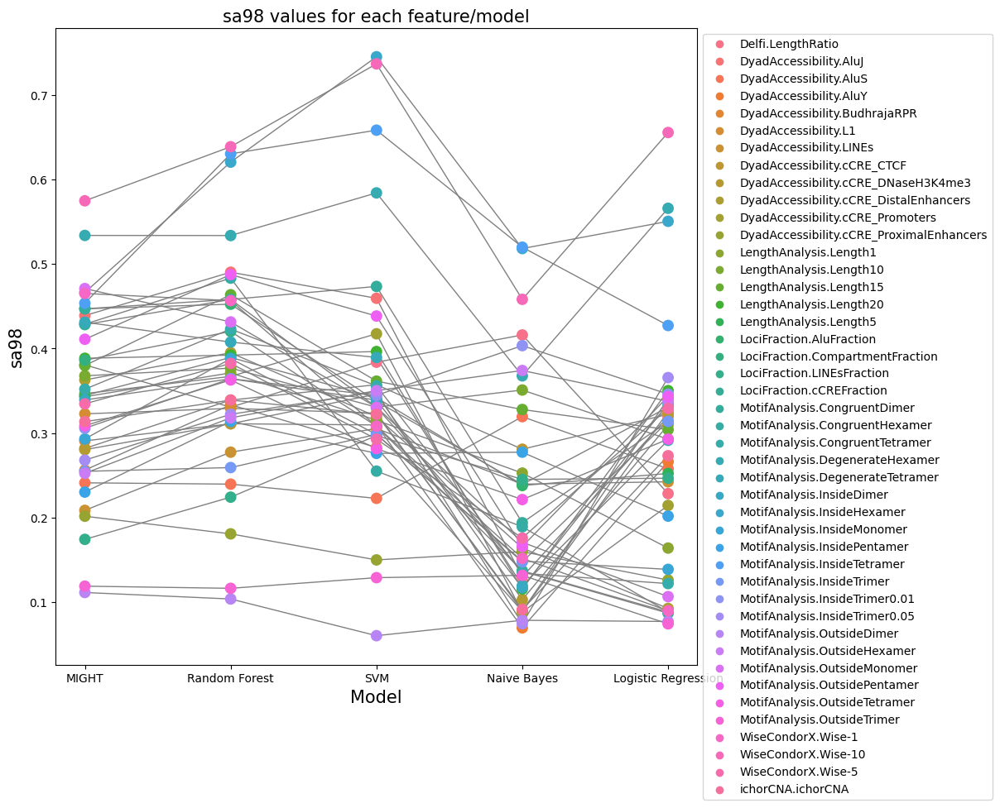

In [111]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Assuming 'results' is your DataFrame and it's already sorted by "Feature"
# Example DataFrame creation for demonstration (replace this with your actual DataFrame)
# results = pd.DataFrame({
#     "Classifier": np.repeat(["A", "B", "C"], 5),
#     "sa98": np.random.rand(15),
#     "Feature": np.tile(["F1", "F2", "F3", "F4", "F5"], 3)
# })
# Get the unique classifiers and features for iteration
classifiers = results["Classifier"].unique()
features = results["Feature"].unique()

plt.figure(figsize=(10, 10))
sns.set_palette(sns.color_palette("Set1", 5))
sns.stripplot(x="Classifier", y="sa98", hue="Feature", data=results.sort_values("Feature"), jitter=False, dodge=False, size=10, linewidth=0, order=classifiers)

# Iterate through each feature to draw lines
for feature in features:
    # Filter the DataFrame for the current feature
    feature_data = results[results["Feature"] == feature]
    # Get the y-values (sa98 values) for the current feature
    y_values = feature_data["sa98"].values
    # Get the x-values (positions) for the current feature across classifiers
    # This assumes the classifiers are evenly spaced and ordered
    x_values = np.arange(len(classifiers))
    # Draw lines between the points for the current feature
    plt.plot(x_values, y_values, color="gray", linestyle='-', linewidth=1)

plt.xlabel("Model", fontsize=15)
plt.ylabel("sa98", fontsize=15)
plt.title("sa98 values for each feature/model", fontsize=15)
plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
plt.savefig(FIG_DIR + "cancer44_sa98_stripplot_per_model_with_lines.png", dpi=120)

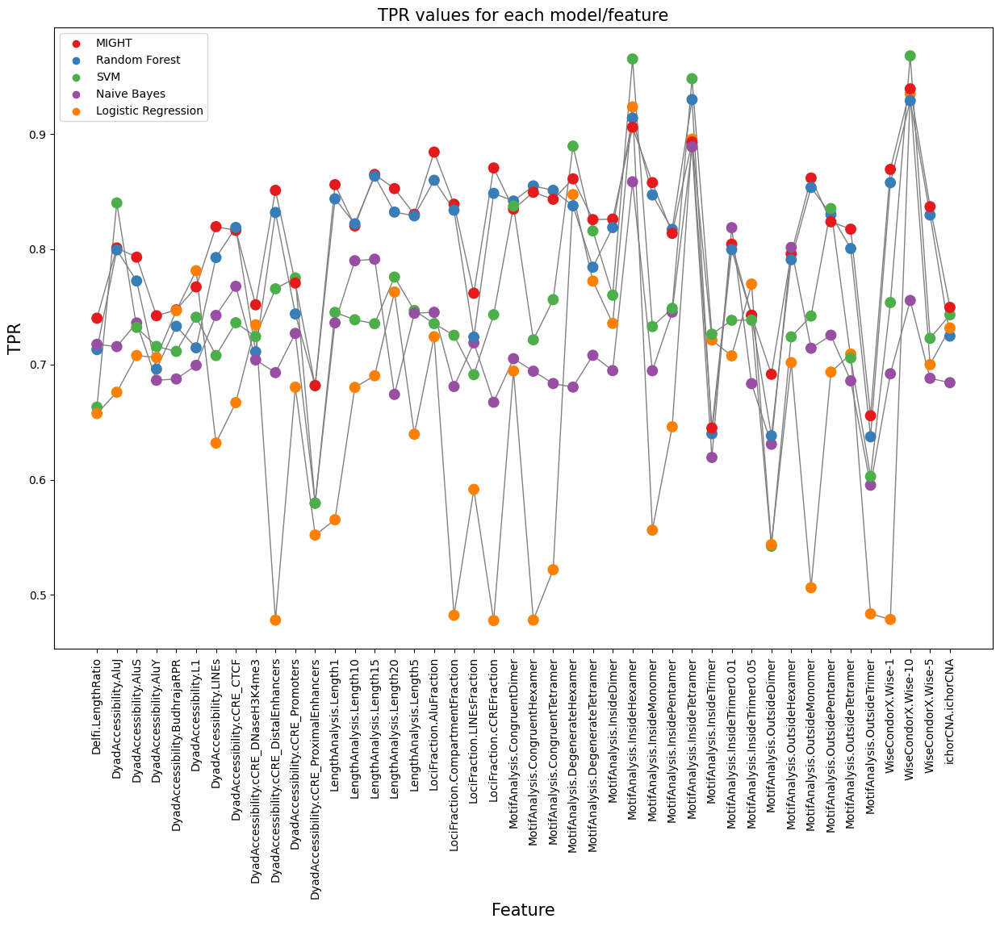

In [112]:
# plot as a stripplot with the sa98 values for each feature
plt.figure(figsize=(15, 10))
# change the hues so the "MIGHT" is red, "Random Forest" is blue, "SVM" is green, "Naive Bayes" is orange, and "Logistic Regression" is purple
sns.set_palette(sns.color_palette("Set1", 5))
sns.stripplot(x="Feature", y="tpr", hue="Classifier", data=df, jitter=False, dodge=False, size=10, hue_order=classifiers)
classifiers = [ "MIGHT", "Random Forest", "SVM","Naive Bayes", "Logistic Regression"]
plt.legend()
# plot the sa98 values for each classifier
for classifier in classifiers:
    classifier_data = df.sort_values("Feature")[df["Classifier"] == classifier]
    y_values = classifier_data["tpr"].values
    # Get the x-values (positions) for the current feature across classifiers
    # This assumes the classifiers are evenly spaced and ordered
    x_values = np.arange(len(features))
    # Draw lines between the points for the current feature
    plt.plot(x_values, y_values, color="gray", linestyle='-', linewidth=1)

plt.xticks(rotation=90)
plt.xlabel("Feature", fontsize=15)
plt.ylabel("TPR", fontsize=15)
plt.title("TPR values for each model/feature", fontsize=15)
# save the plot
plt.savefig(FIG_DIR + "cancer44_tpr_stripplot.png", dpi=120)

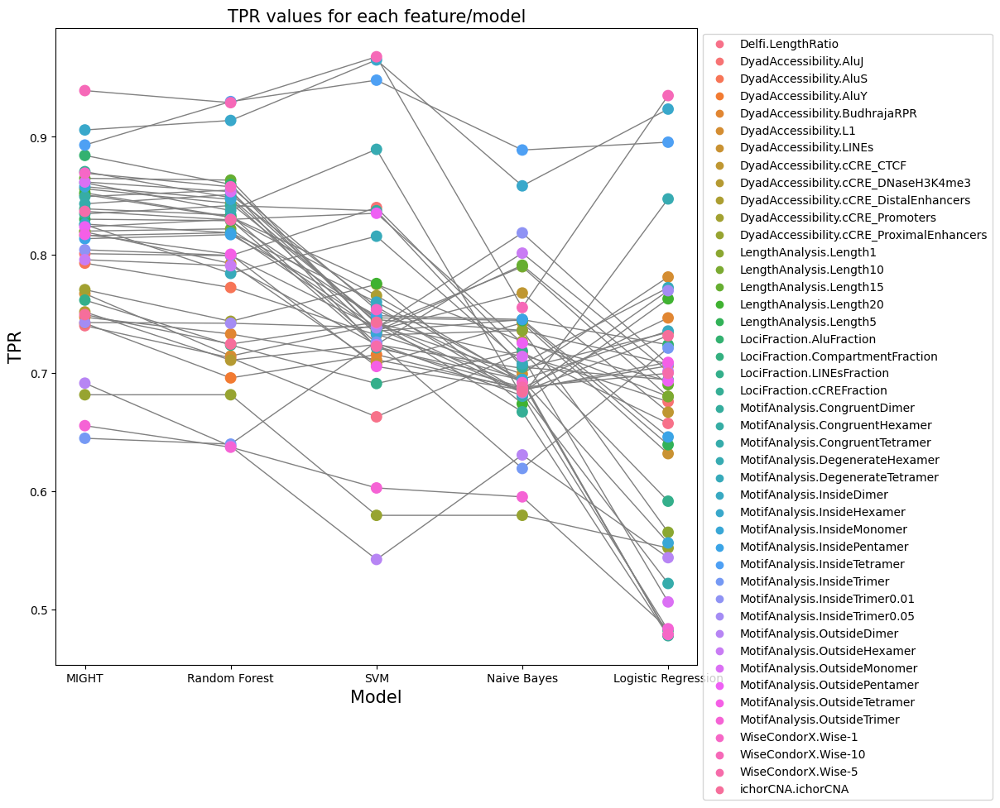

In [113]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Assuming 'results' is your DataFrame and it's already sorted by "Feature"
# Example DataFrame creation for demonstration (replace this with your actual DataFrame)
# results = pd.DataFrame({
#     "Classifier": np.repeat(["A", "B", "C"], 5),
#     "sa98": np.random.rand(15),
#     "Feature": np.tile(["F1", "F2", "F3", "F4", "F5"], 3)
# })
# Get the unique classifiers and features for iteration
classifiers = results["Classifier"].unique()
features = results["Feature"].unique()

plt.figure(figsize=(10, 10))
sns.set_palette(sns.color_palette("Set1", 5))
sns.stripplot(x="Classifier", y="tpr", hue="Feature", data=results.sort_values("Feature"), jitter=False, dodge=False, size=10, linewidth=0, order=classifiers)

# Iterate through each feature to draw lines
for feature in features:
    # Filter the DataFrame for the current feature
    feature_data = results[results["Feature"] == feature]
    # Get the y-values (sa98 values) for the current feature
    y_values = feature_data["tpr"].values
    # Get the x-values (positions) for the current feature across classifiers
    # This assumes the classifiers are evenly spaced and ordered
    x_values = np.arange(len(classifiers))
    # Draw lines between the points for the current feature
    plt.plot(x_values, y_values, color="gray", linestyle='-', linewidth=1)

plt.xlabel("Model", fontsize=15)
plt.ylabel("TPR", fontsize=15)
plt.title("TPR values for each feature/model", fontsize=15)
plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
plt.savefig(FIG_DIR + "cancer44_TPR_stripplot_per_model_with_lines.png", dpi=120)